In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import re
from metrics import cognitive_dissonance

plt.rcParams.update({
    "font.size": 14,            # base text size
    "axes.titlesize": 16,       # subplot titles
    "axes.labelsize": 15,       # x/y labels
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "legend.fontsize": 14,
    "figure.titlesize": 18      # suptitle size
})


In [2]:
def truthfulness(q, true_hypothesis):
    """q[simulations, timesteps, agents, hypotheses]"""
    q_truth = q[:, :, :, true_hypothesis]
    #T = np.mean(q_truth, axis=(0,2))
    mean_per_sim = q_truth.mean(axis=2)          # avg over agents 
    T = mean_per_sim.mean(axis=0)             # avg over sims   
    std  = mean_per_sim.std(axis=0)              # std across sims 
    return T, std

def load_beliefs(filename):
    beliefs = np.load(filename)
    q_0 = beliefs["private"]
    p_0 = beliefs["public"]
    indir_trust = beliefs["avg_indtrust"]
    dir_trust = beliefs["avg_dirtrust"]
    T_0, std = truthfulness(q_0, 3) 
    T = T_0[1::]
    std = std[1::]
    t = np.arange(1, len(T_0))

    return q_0, p_0, indir_trust, dir_trust, T, std, t


In [3]:
def extract_beta(filename):
    m = re.search(r"_b([0-9.]+)_", filename)
    return m.group(1) if m else None

def load_folder(folder_path="."):
    data_dict = {}

    for file in os.listdir(folder_path):
        if not file.endswith(".npz"):
            continue

        beta = extract_beta(file)

        if beta:                            
            key = beta
        elif "uniform" in file:             
            key = "uniform"
        else:
            continue

        data_dict[key] = load_beliefs(os.path.join(folder_path, file))

    return data_dict


def plot_loaded(data_dict, xlim=100, ylim=[0,1], title=""):
    plt.figure(figsize=(15, 10))

    for b_value, (q, p, indir_trust, dir_trust, truthfulness, std, t) in data_dict.items():
        label = f"beta={b_value}" if b_value != "uniform" else "uniform"
        plt.plot(t, truthfulness, label=label)
        plt.fill_between(t, truthfulness-std, truthfulness+std, alpha=0.2)  

    plt.grid()
    plt.xlabel("Time steps")
    plt.ylabel(r"Truthfulness, $\tau$")
    plt.xlim([0, xlim])
    plt.ylim(ylim)
    plt.title("Truthfulness as a function of time, " + title)
    plt.legend()
    file = title.replace(" ", "_").replace(",", "").replace("=", "")
    plt.savefig(file + "_truthfulness.png")
    plt.show()

def plot_cd(data_dict, xlim=100):
    plt.figure(figsize=(15, 10))
    for b_value, (q, p, indir_trust, dir_trust, truthfulness, std, t) in data_dict.items():
        cd = cognitive_dissonance(q, p)
        plt.plot(t, cd[1::], label=f"beta={b_value}")

    plt.grid()
    plt.xlabel("Time steps")
    plt.ylabel("Cognitive dissonance")
    plt.xlim([0, xlim])
    plt.title("Cognitive dissonance as a function of time")
    plt.legend()
    plt.show()

def plot_indtrust(data_dict, xlim=100, title=""):
    plt.figure(figsize=(15, 10))
    for b_value, (q, p, indir_trust, dir_trust, truthfulness, std, t) in data_dict.items():
        label = f"beta={b_value}" if b_value != "uniform" else "uniform"
        plt.plot(t, np.mean(indir_trust, axis=0)[1::], label=label)

    plt.grid()
    plt.xlabel("Time steps")
    plt.ylabel("Trust")
    plt.xlim([0, xlim])
    plt.title("Average indirect trust as a function of time, " + title)
    plt.legend()
    file = title.replace(" ", "_").replace(",", "").replace("=", "")
    plt.savefig(file + "_ind_trust.png")
    plt.show()

def plot_dirtrust(data_dict, xlim=100, ylim=[0.4, 1], title=""):
    plt.figure(figsize=(15, 10))
    for b_value, (q, p, indir_trust, dir_trust, truthfulness, std, t) in data_dict.items():
        label = f"beta={b_value}" if b_value != "uniform" else "uniform"
        mean_trust = np.mean(dir_trust, axis=0)[1::]
        std_trust = np.std(dir_trust, axis=0)[1::]
        plt.plot(t, mean_trust, label=label)
        plt.fill_between(t, mean_trust-std_trust, mean_trust+std_trust, alpha=0.2)  

    plt.grid()
    plt.xlabel("Time steps")
    plt.ylabel("Trust")
    plt.xlim([0, xlim])
    plt.ylim(ylim)
    plt.title("Average direct trust as a function of time, " + title)
    plt.legend()
    file = title.replace(" ", "_").replace(",", "").replace("=", "")
    plt.savefig(file + "_dir_trust.png")
    plt.show()

def plot_agent_beliefs(filename, title_suffix="", xlim=200):
    q, p, indir_trust, dir_trust, truthfulness, t = load_beliefs(filename)
    true_hyp = 3

    beta = extract_beta(filename)
    label = f"beta={beta}" if beta else "uniform weights"

    data_mean = q[:, :, :, true_hyp].mean(axis=0)
    t_plot = np.arange(data_mean.shape[0]) + 1
    cmap = "turbo"          
    n_agents = data_mean.shape[1]
    colours = plt.get_cmap(cmap)(np.linspace(0, 1, n_agents))


    plt.figure(figsize=(15, 10))

    for agent in range(data_mean.shape[1]):
        plt.plot(t_plot, data_mean[:, agent], color=colours[agent], alpha=0.6, linewidth=0.8)

    ax = plt.gca()
    ax.set_xscale("log")
    ax.set_xlim(1, xlim)

    plt.xlabel("Time")
    plt.ylabel("Avg belief in the true hypothesis")
    plt.title(f"Belief trajectories, {title_suffix}, {label}")
    plt.grid(alpha=0.3)
    plt.ylim(0, 1)
    file = title_suffix.replace(" ", "_").replace(",", "").replace("=", "")
    safe_label = label.replace(" ", "_").replace("=", "")
    plt.savefig(file + "_" + safe_label + "_beliefs.png")
    plt.show()

def plot_agent_beliefs_single(filename, sim_index=0, title_suffix="", xlim=200, xlog=True):
    q, p, indir_trust, dir_trust, truthfulness, std, t = load_beliefs(filename)
    true_hyp = 3

    beta = extract_beta(filename)
    label = f"beta={beta}" if beta else "uniform weights"

    # Single simulation → shape (timesteps, agents)
    data = q[sim_index, :, :, true_hyp]
    last_values = data[-1]                       # belief of each agent at final timestep
    order = np.argsort(last_values)
    data = data[:, order]

    t_plot = np.arange(data.shape[0]) + 1
    cmap = "gist_rainbow"           # good default, also try "plasma", "inferno", "turbo"
    n_agents = data.shape[1]
    colours = plt.get_cmap(cmap)(np.linspace(0, 1, n_agents))

    plt.figure(figsize=(15, 10))
    for agent in range(data.shape[1]):
        plt.plot(t_plot, data[:, agent], color=colours[agent], alpha=0.8, linewidth=0.8)

    ax = plt.gca()
    if xlog:
        ax.set_xscale("log")
        ax.set_xlim(1, xlim)
    else:
        ax.set_xlim(0, xlim)

    plt.xlabel("Time")
    plt.ylabel("Belief in the true hypothesis")
    plt.title(f"Belief trajectories, {title_suffix}, {label} (simulation {sim_index})")
    plt.grid(alpha=0.3)
    plt.ylim(0, 1)

    # filename-safe version
    safe_title = title_suffix.replace(" ", "_").replace(",", "").replace("=", "")
    safe_label = label.replace(" ", "_").replace("=", "")
    plt.savefig(f"{safe_title}_{safe_label}_sim{sim_index}_beliefs.png")
    plt.show()



def plot_all_agent_beliefs(folder, title_suffix="", xlim=200):
    for file in os.listdir(folder):
        if file.endswith(".npz"):
            plot_agent_beliefs(os.path.join(folder, file),
                               title_suffix=title_suffix,
                               xlim=xlim)
            
            
def plot_all_agent_beliefs_single(folder_path=".", sim_index=0, title_suffix="", xlim=250, xlog=True):
    for file in os.listdir(folder_path):
        if not file.endswith(".npz"):
            continue

        filepath = os.path.join(folder_path, file)
        beta = extract_beta(file)
        label = f"beta={beta}" if beta else "uniform weights"

        plot_agent_beliefs_single(filepath, sim_index=sim_index, title_suffix=title_suffix, xlim=xlim, xlog=xlog)


    

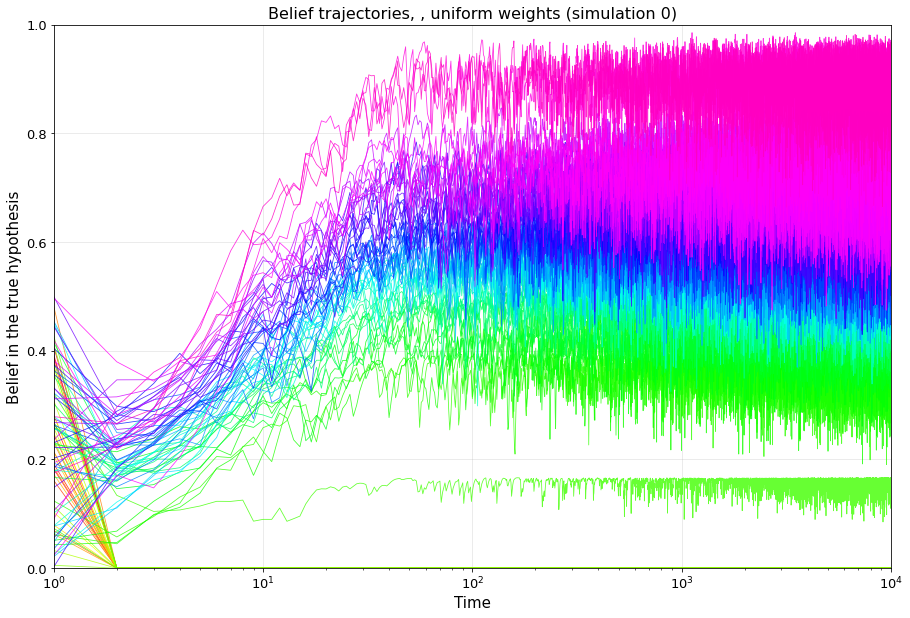

In [8]:
file = "N100_uniform_numsim1_iter10000_flex0.8_BA_consp35_timeev.npz"
plot_agent_beliefs_single(file, 0, xlim=10000)

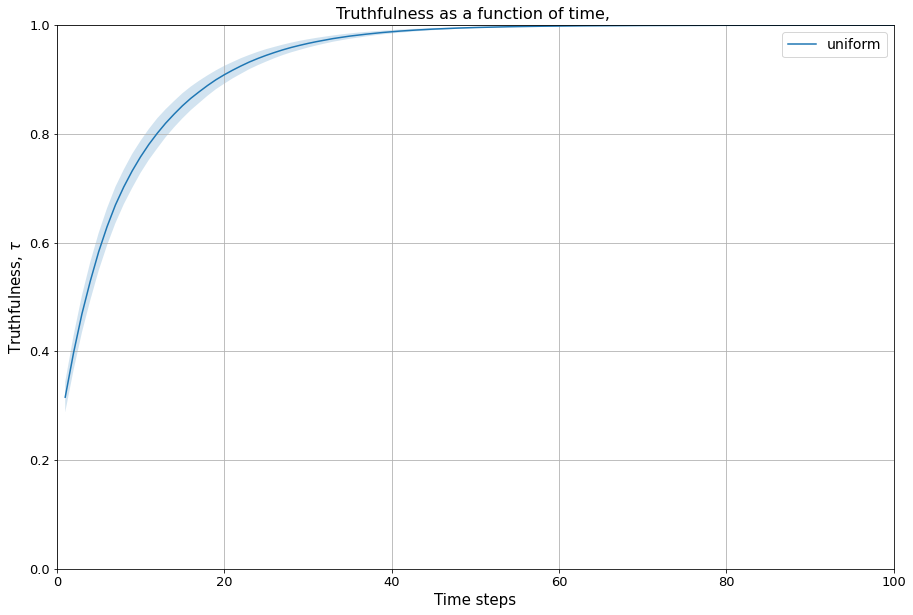

In [4]:
folder = r"C:\Users\bibia\OneDrive\OneDrive - NTNU\5. klasse\Prosjektoppgaven\DHT-simulations-misinformation-propagation-main\Data files\Time evolution\log_lin"
data = load_folder(folder)
plot_loaded(data)

In [131]:
folder_name = r"C:\Users\bibia\OneDrive\OneDrive - NTNU\5. klasse\Prosjektoppgaven\DHT-simulations-misinformation-propagation-main\Data files\Time evolution\BA_0_consp"
data = load_folder(folder_name)

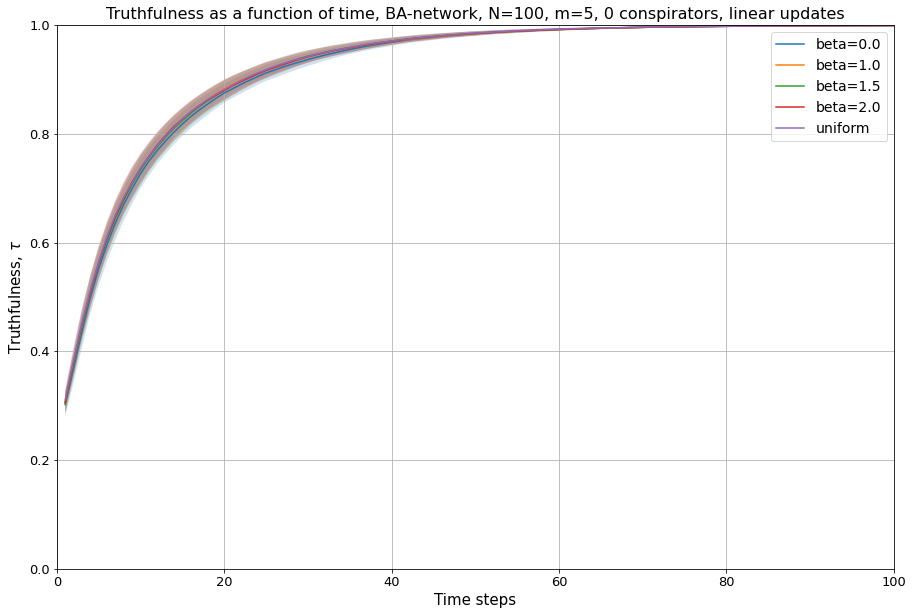

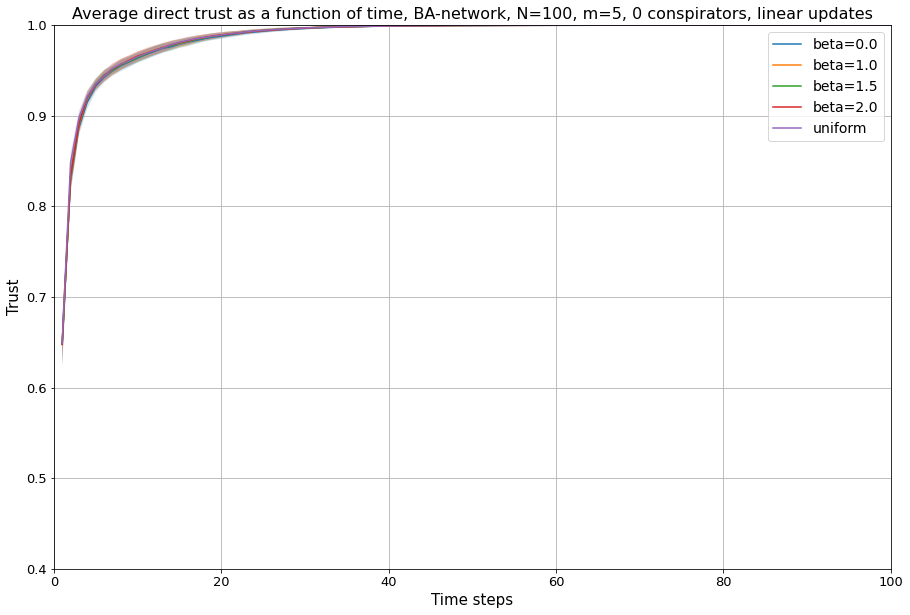

In [132]:
plot_loaded(data, xlim=100, title="BA-network, N=100, m=5, 0 conspirators, linear updates")
plot_dirtrust(data, xlim=100, title="BA-network, N=100, m=5, 0 conspirators, linear updates")

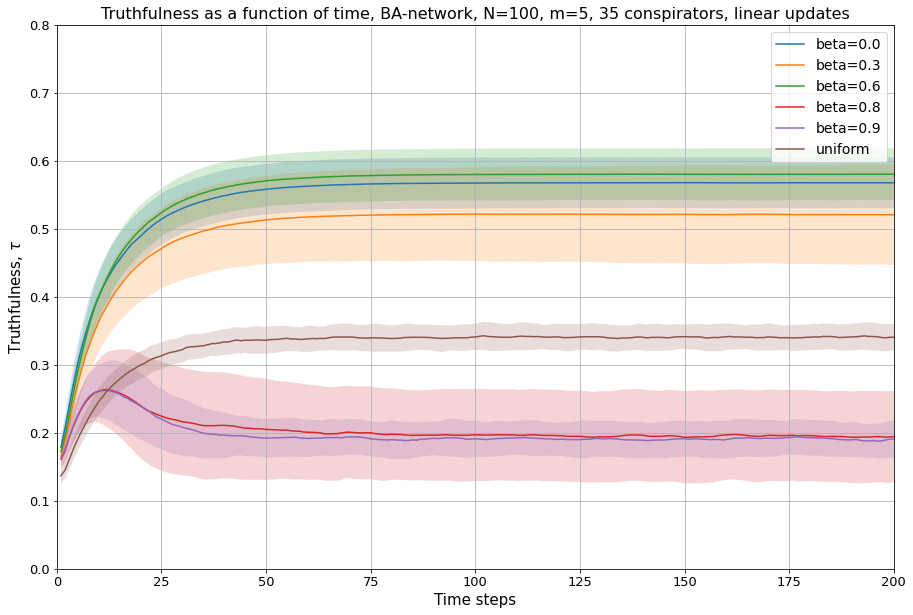

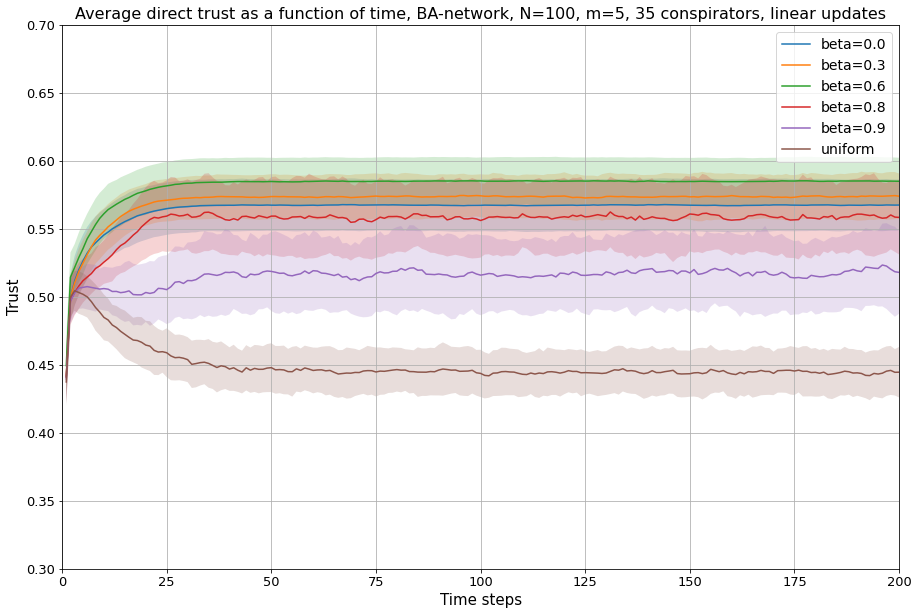

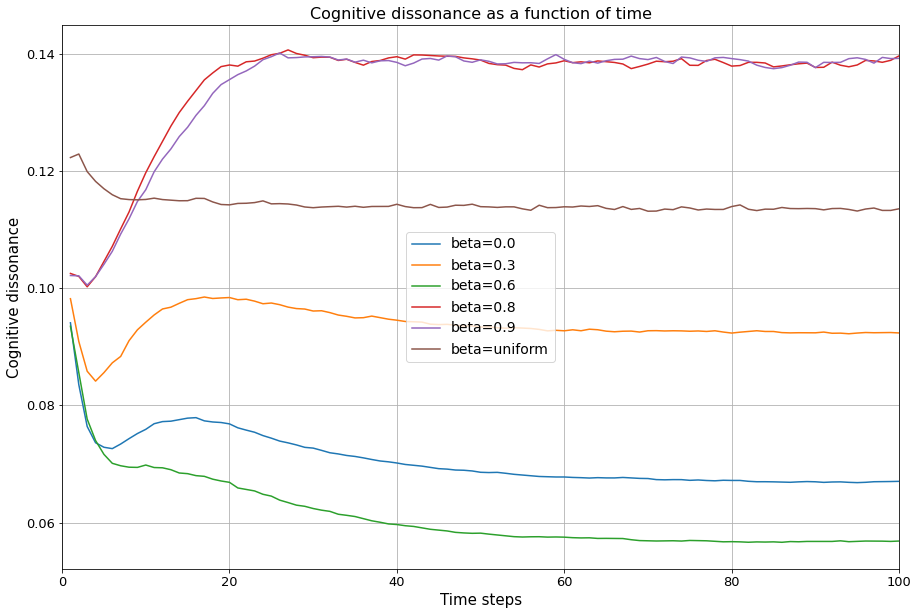

In [ ]:
folder_name = r"C:\Users\bibia\OneDrive\OneDrive - NTNU\5. klasse\Prosjektoppgaven\DHT-simulations-misinformation-propagation-main\Data files\Time evolution\BA_35_consp_new_trust"
data = load_folder(folder_name)
plot_loaded(data, xlim=200, ylim=[0, 0.8], title="BA-network, N=100, m=5, 35 conspirators, linear updates")
plot_dirtrust(data, xlim=200, ylim=[0.3, 0.7], title="BA-network, N=100, m=5, 35 conspirators, linear updates")
plot_cd(data)

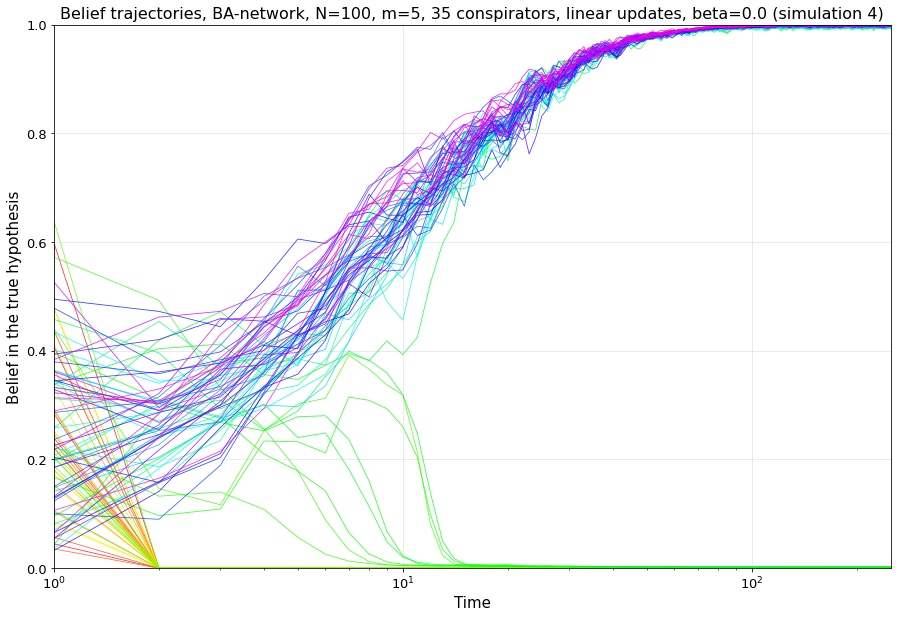

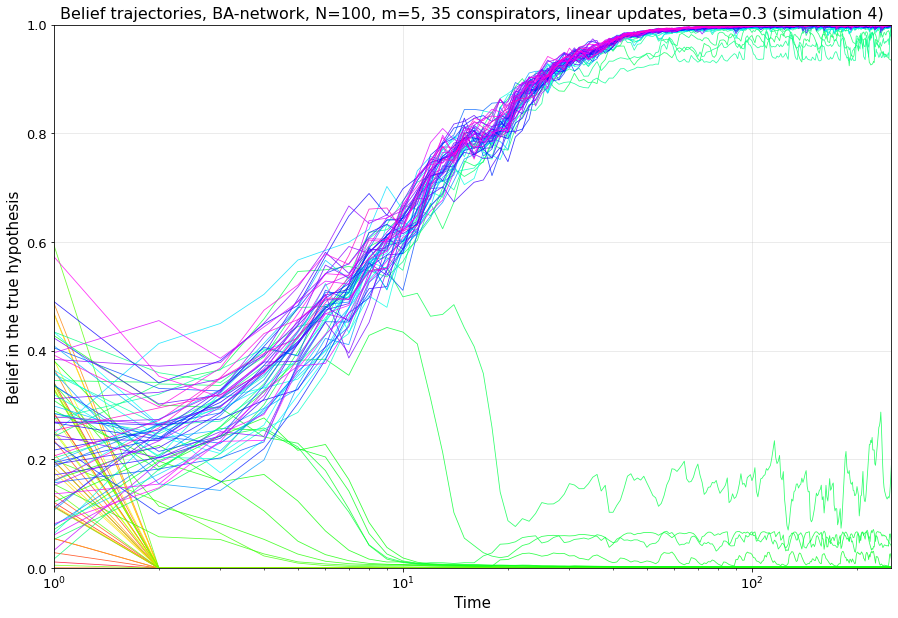

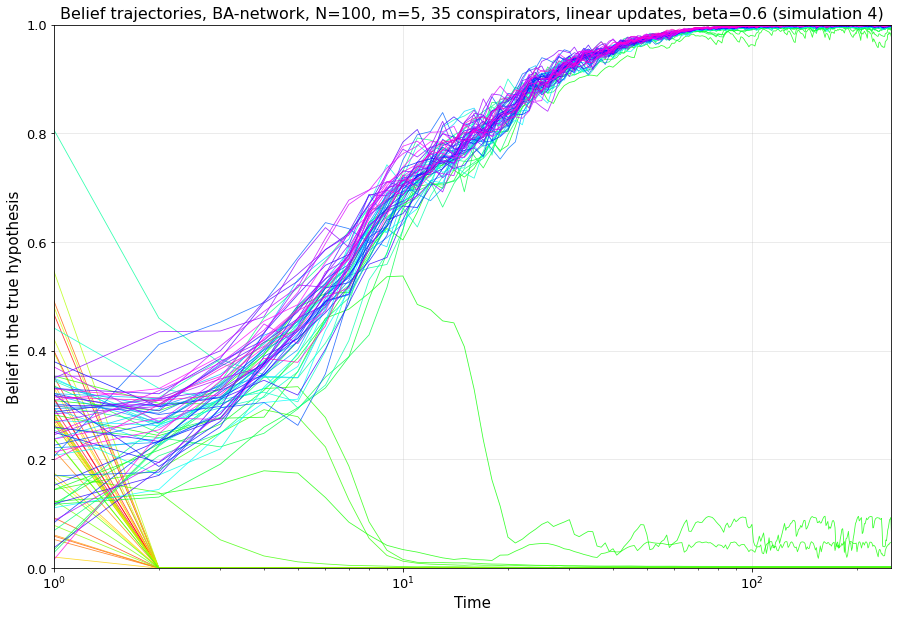

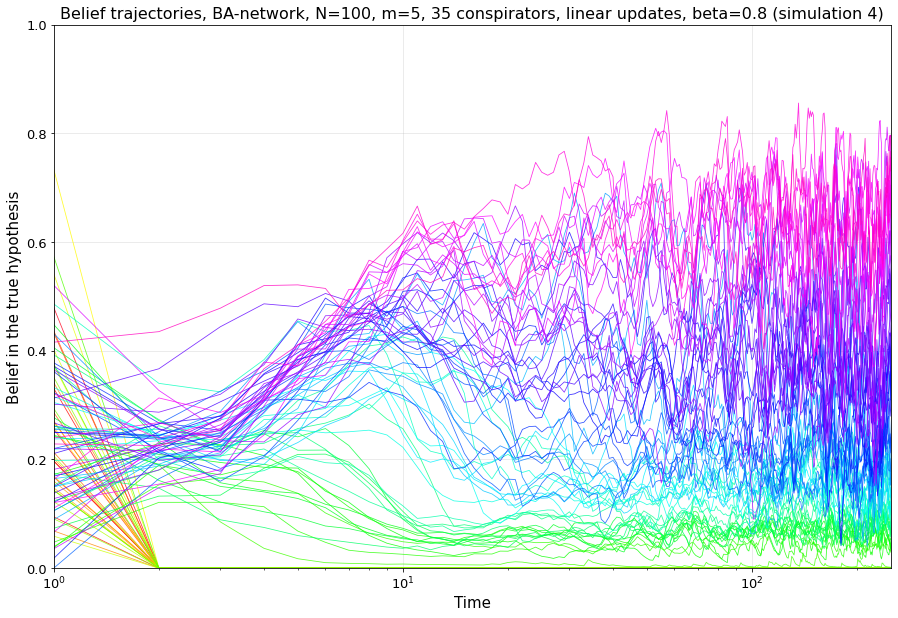

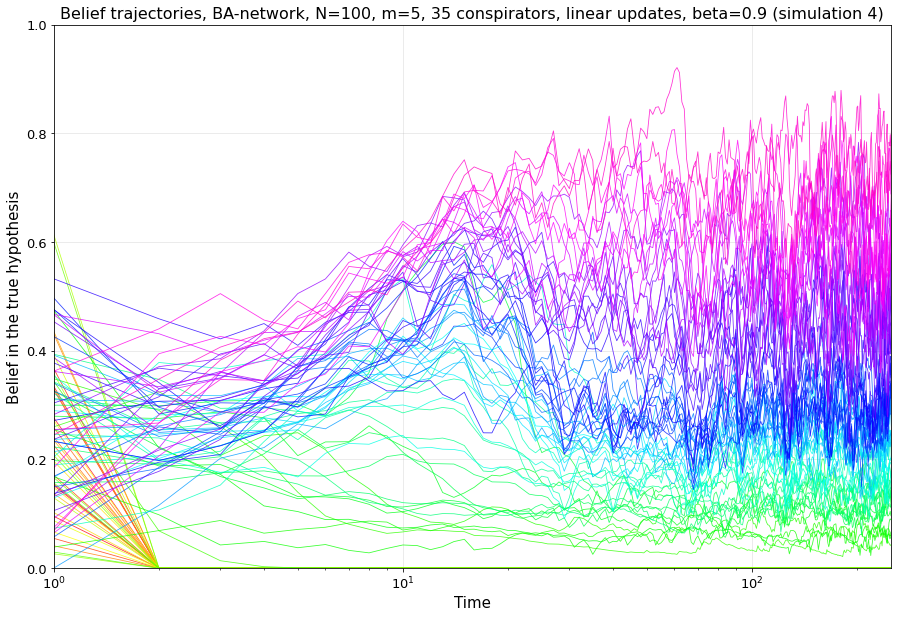

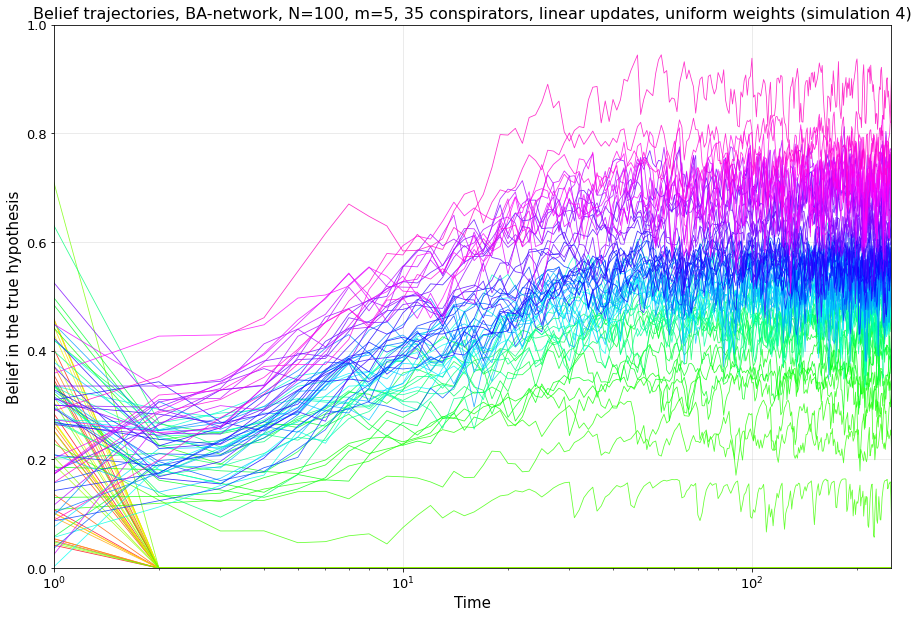

In [19]:
plot_all_agent_beliefs_single(folder_name, title_suffix="BA-network, N=100, m=5, 35 conspirators, linear updates", sim_index=4)

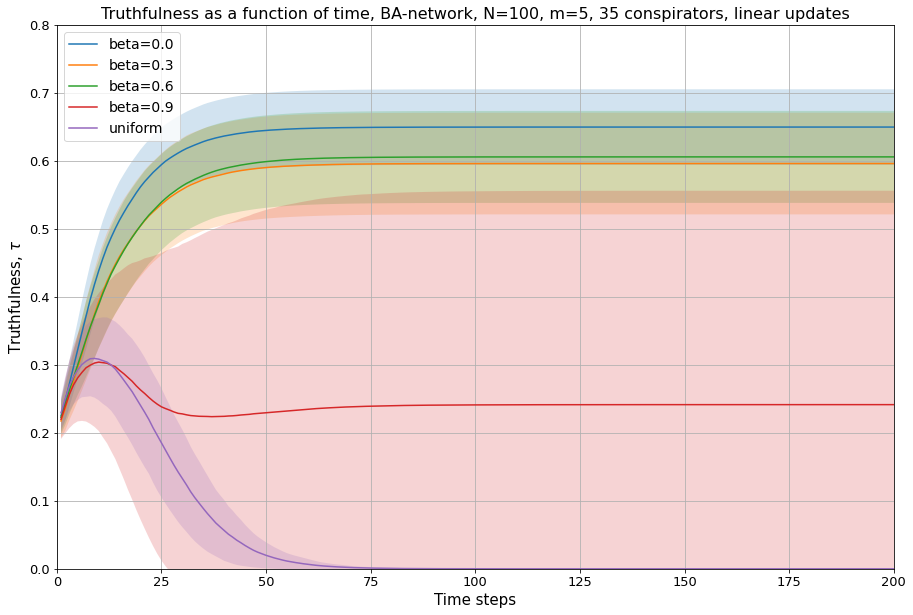

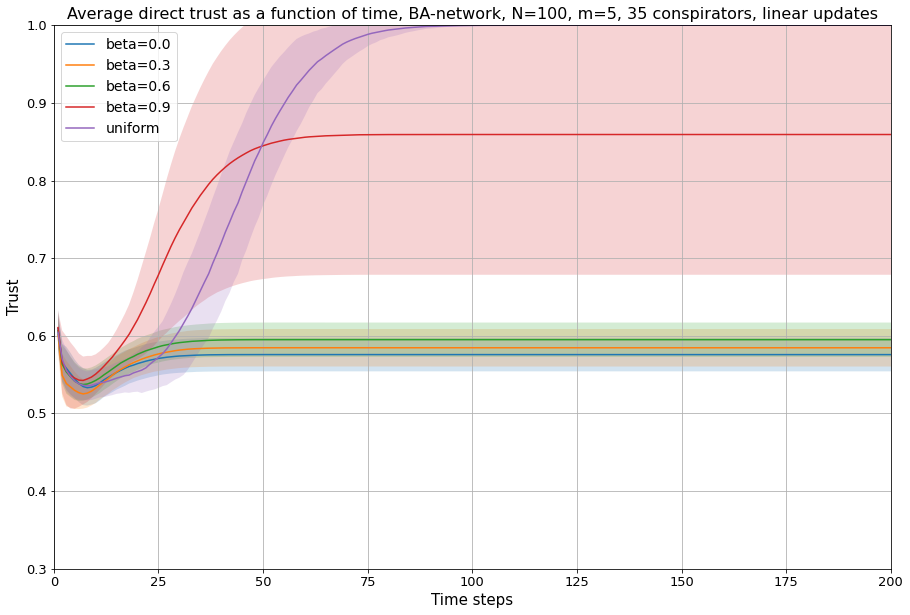

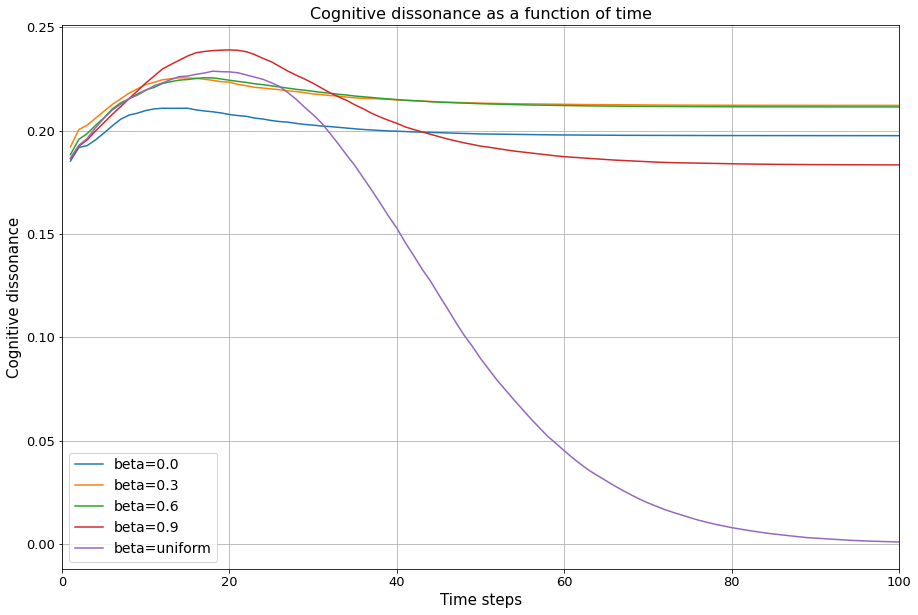

In [24]:
folder_name = r"C:\Users\bibia\OneDrive\OneDrive - NTNU\5. klasse\Prosjektoppgaven\DHT-simulations-misinformation-propagation-main\Data files\Time evolution\BA_4_consp_new_trust_log"
data = load_folder(folder_name)
plot_loaded(data, xlim=200, ylim=[0, 0.8], title="BA-network, N=100, m=5, 35 conspirators, linear updates")
plot_dirtrust(data, xlim=200, ylim=[0.3, 1], title="BA-network, N=100, m=5, 35 conspirators, linear updates")
plot_cd(data)

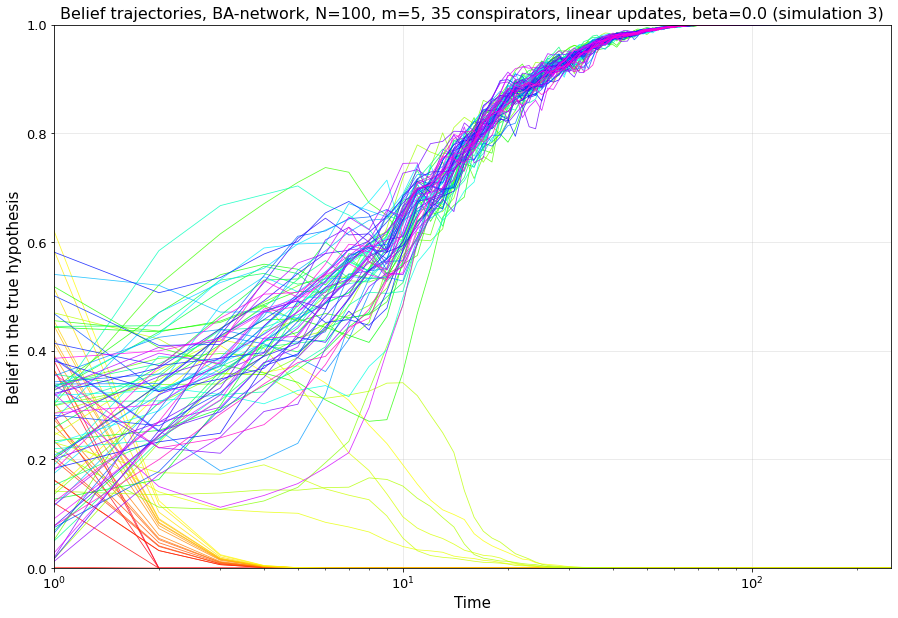

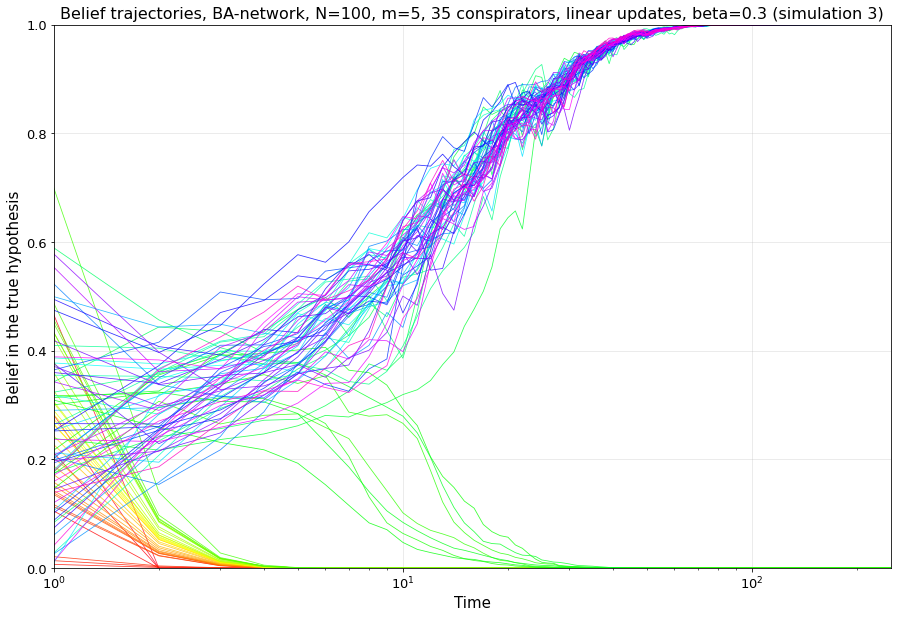

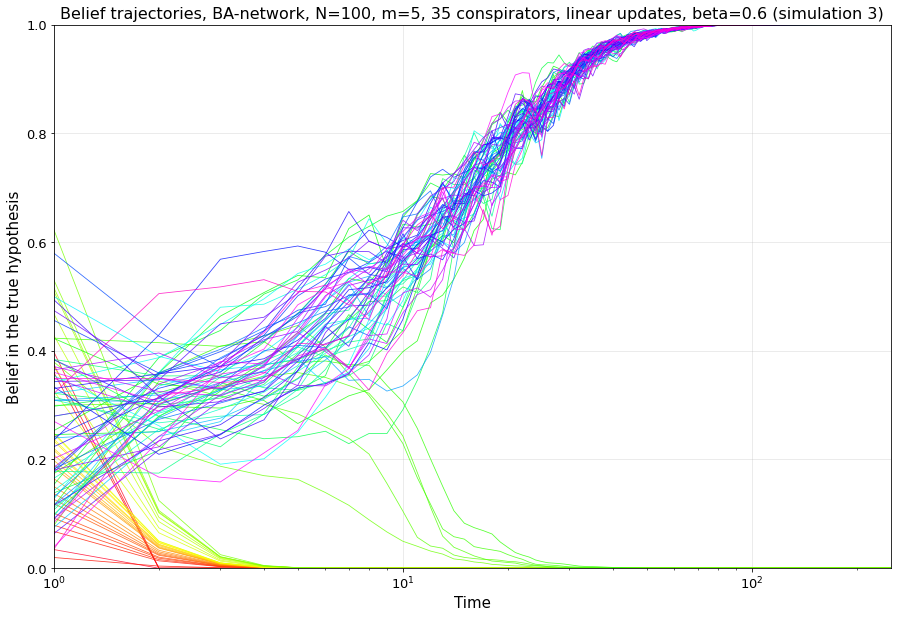

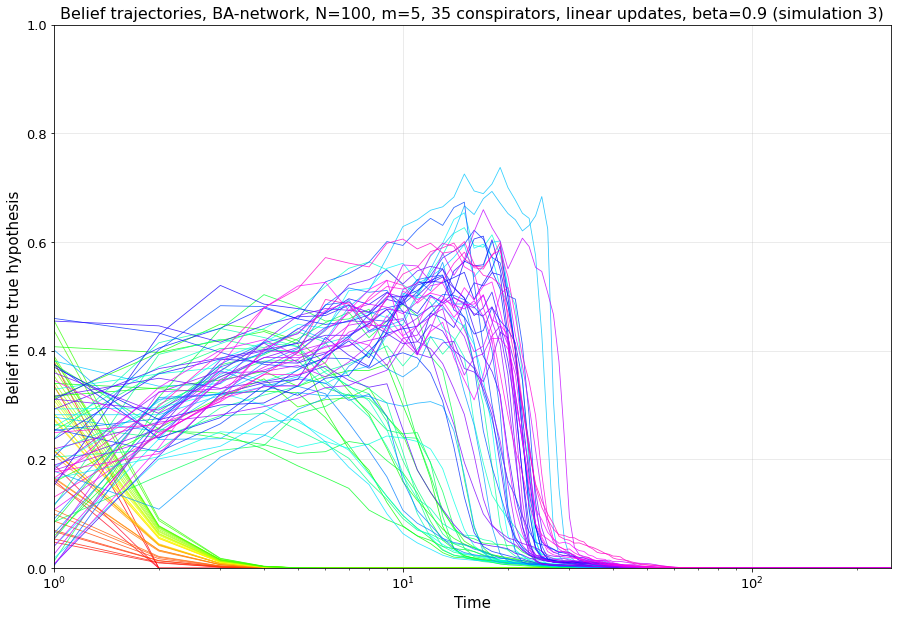

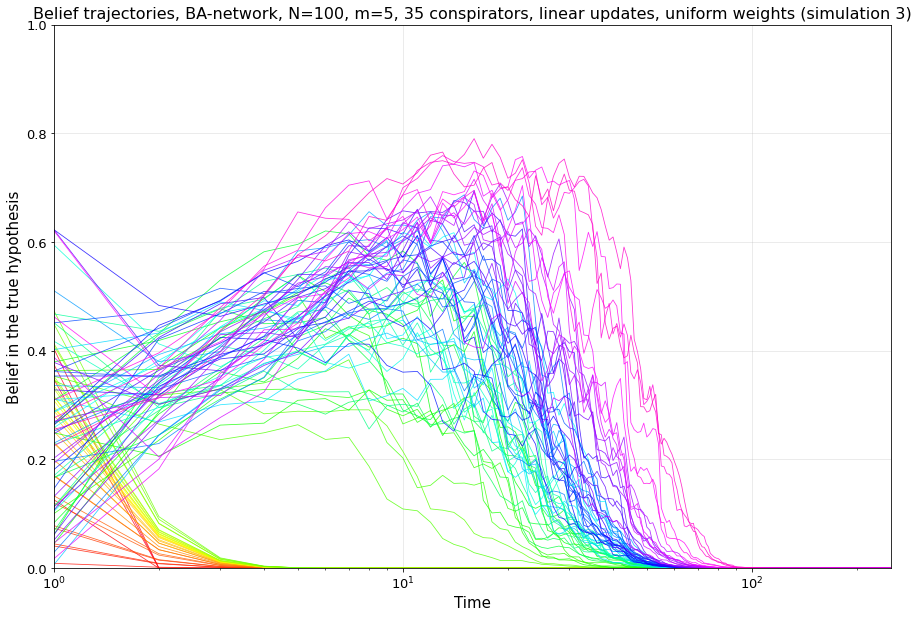

In [25]:
plot_all_agent_beliefs_single(folder_name, title_suffix="BA-network, N=100, m=5, 35 conspirators, linear updates", sim_index=3)

In [133]:
#plot_all_agent_beliefs_single(folder_name, title_suffix="BA-network, N=100, m=5, 0 conspirators")

In [ ]:
folder_name = r"C:\Users\bibia\OneDrive\OneDrive - NTNU\5. klasse\Prosjektoppgaven\DHT-simulations-misinformation-propagation-main\Data files\Time evolution\BA_4_consp_log"
data = load_folder(folder_name)

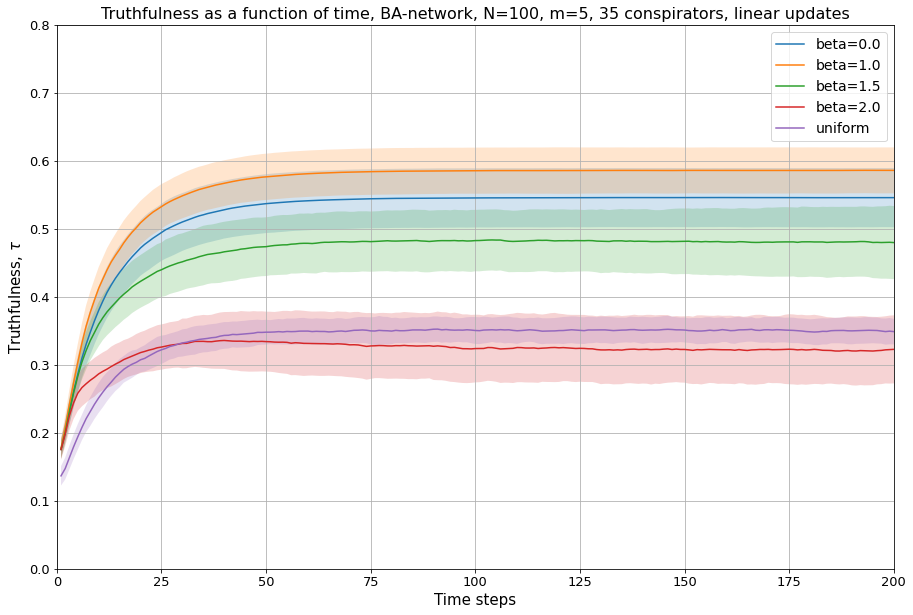

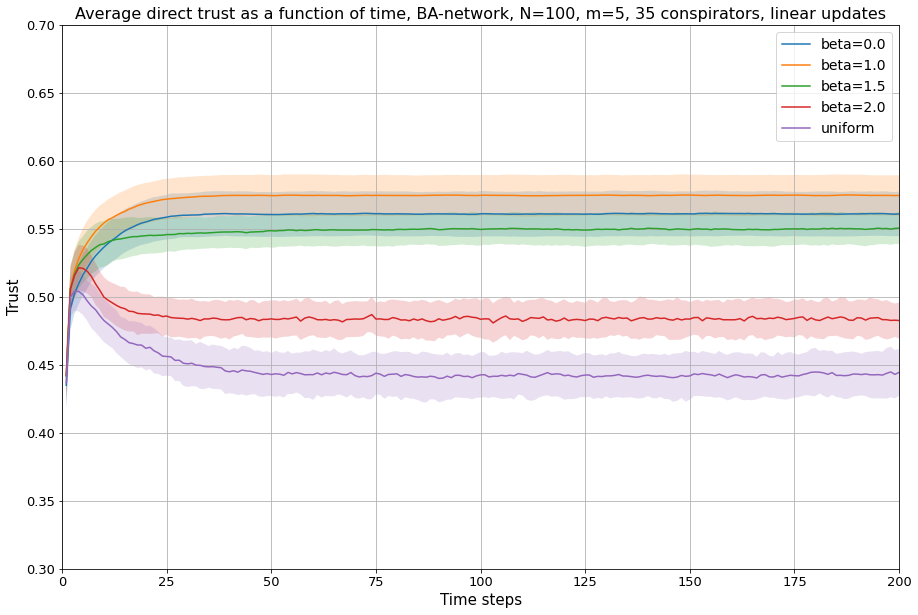

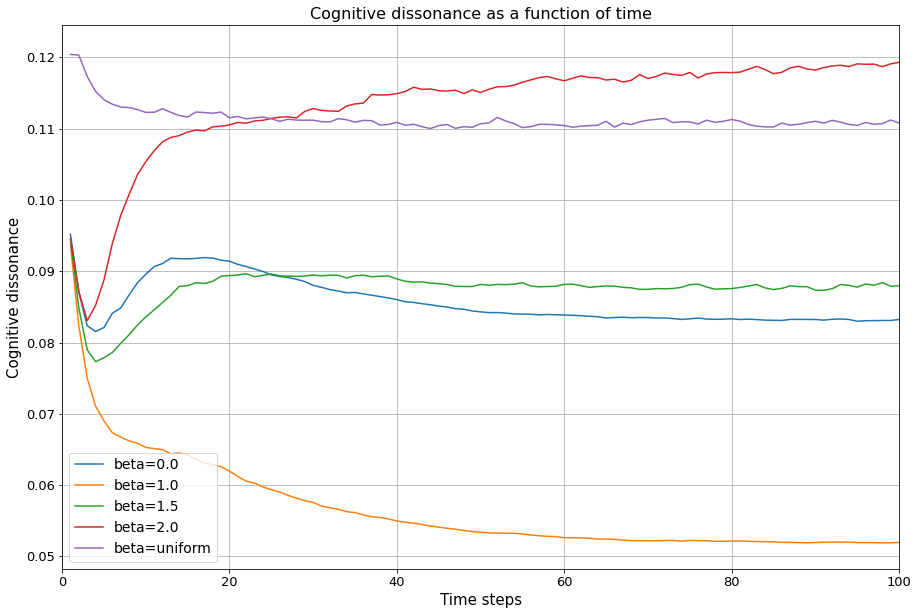

In [135]:
plot_loaded(data, xlim=200, ylim=[0, 0.8], title="BA-network, N=100, m=5, 35 conspirators, linear updates")
plot_dirtrust(data, xlim=200, ylim=[0.3, 0.7], title="BA-network, N=100, m=5, 35 conspirators, linear updates")
plot_cd(data)

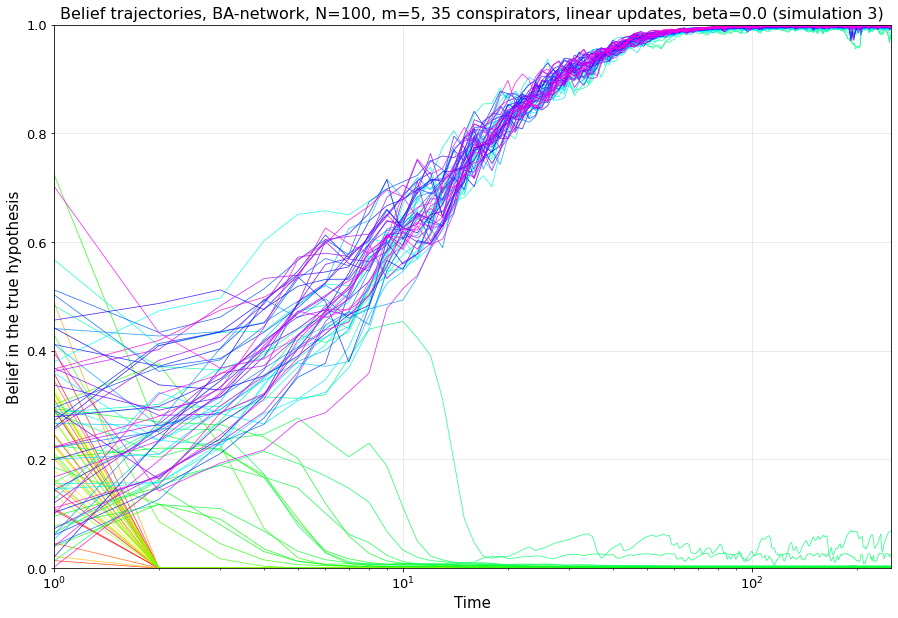

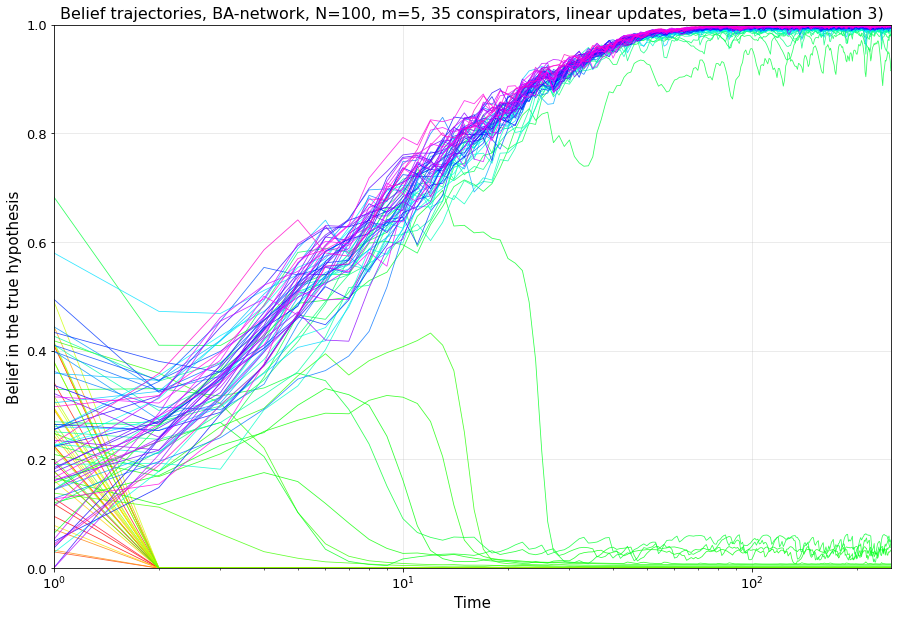

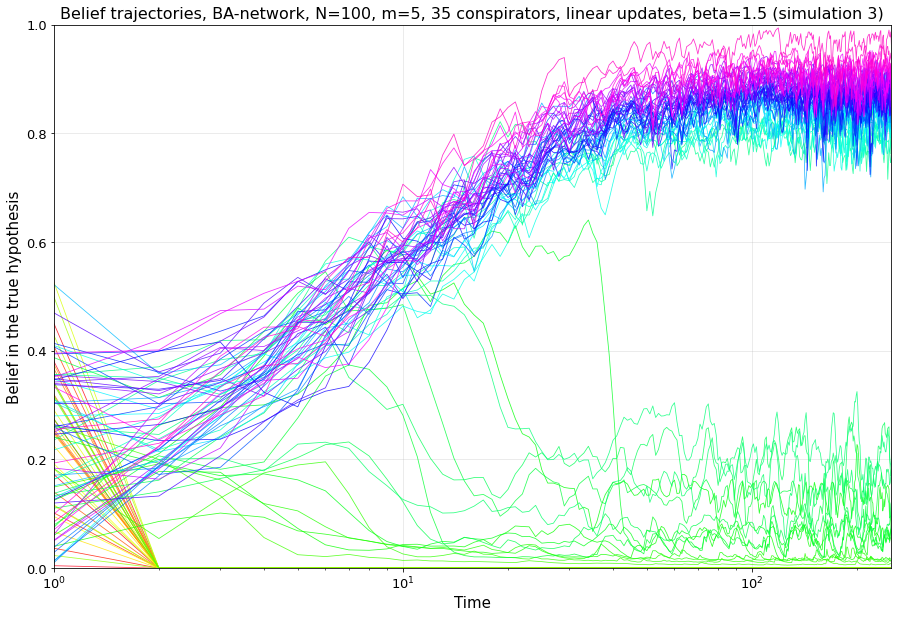

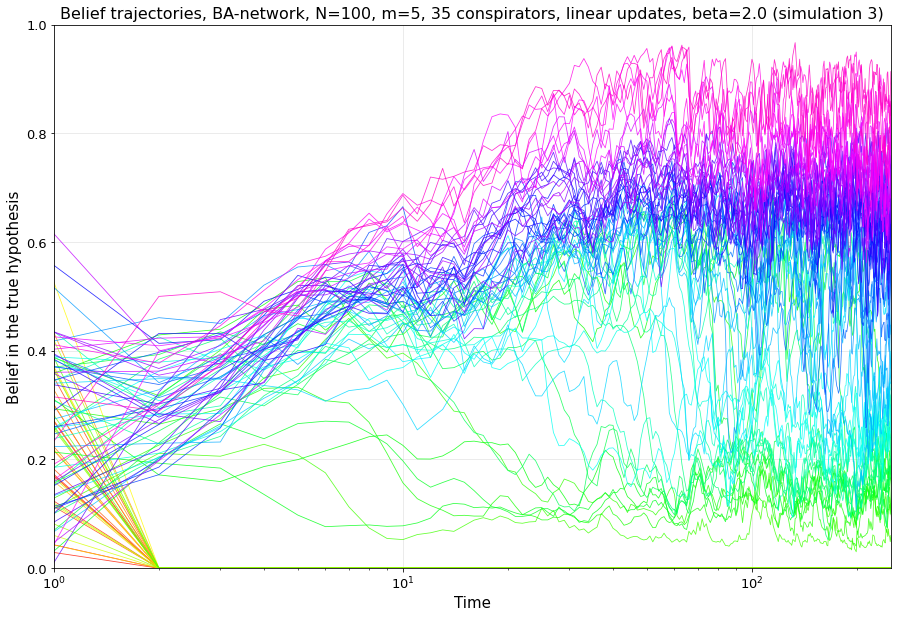

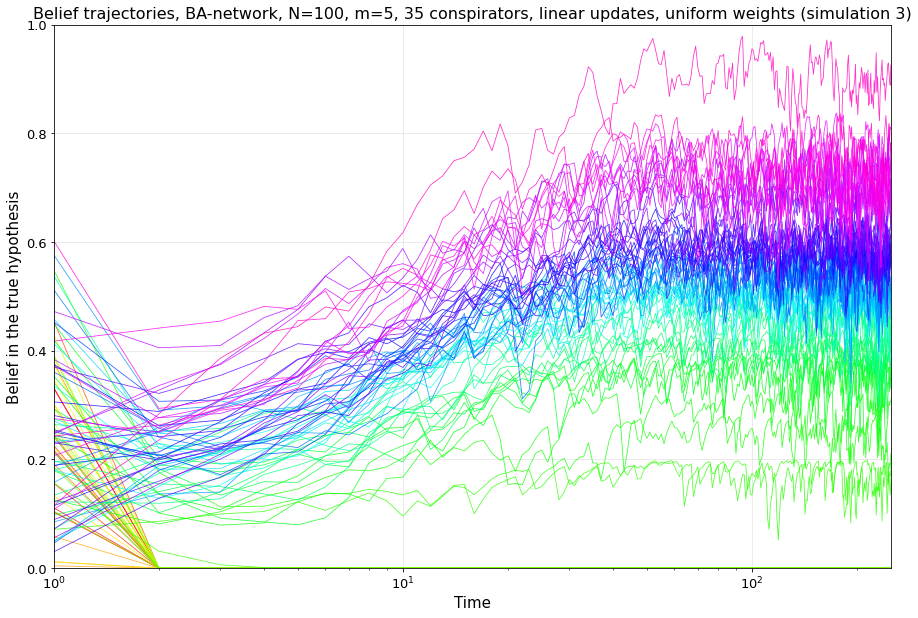

In [136]:
#plot_all_agent_beliefs(folder_name, title_suffix="BA-network, N=100, m=5, 35 conspirators")
plot_all_agent_beliefs_single(folder_name, title_suffix="BA-network, N=100, m=5, 35 conspirators, linear updates", sim_index=3)

In [137]:
folder_name = r"C:\Users\bibia\OneDrive\OneDrive - NTNU\5. klasse\Prosjektoppgaven\DHT-simulations-misinformation-propagation-main\Data files\Time evolution\BA_15_consp"
data = load_folder(folder_name)

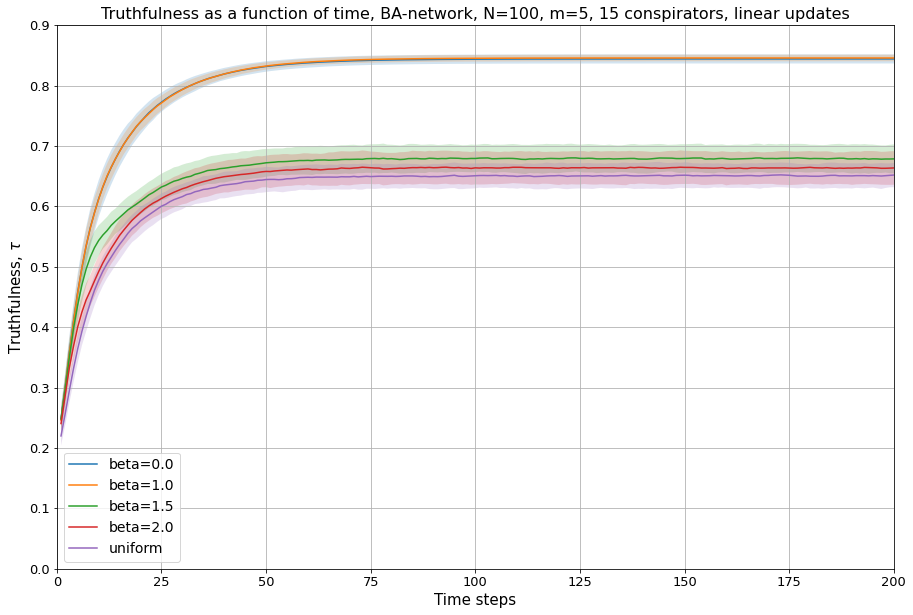

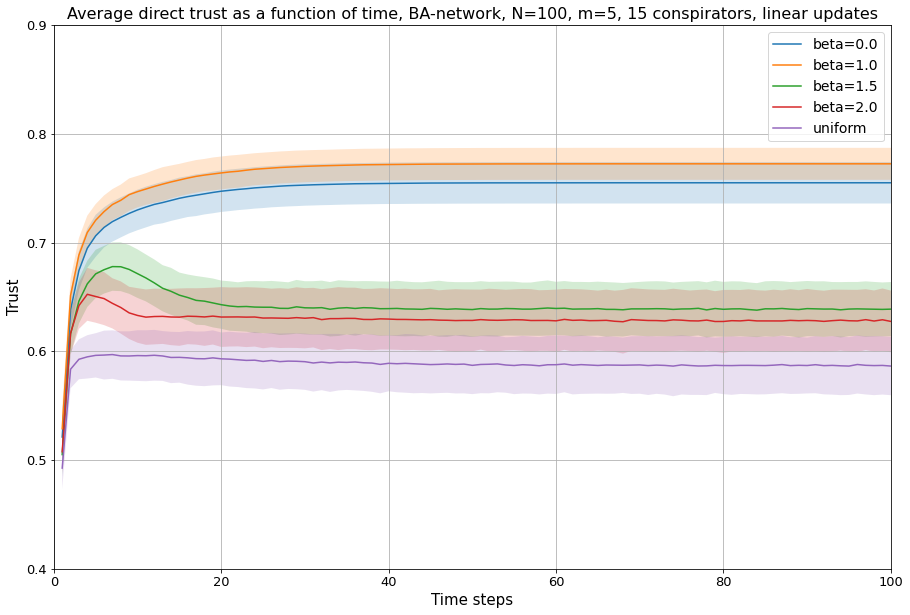

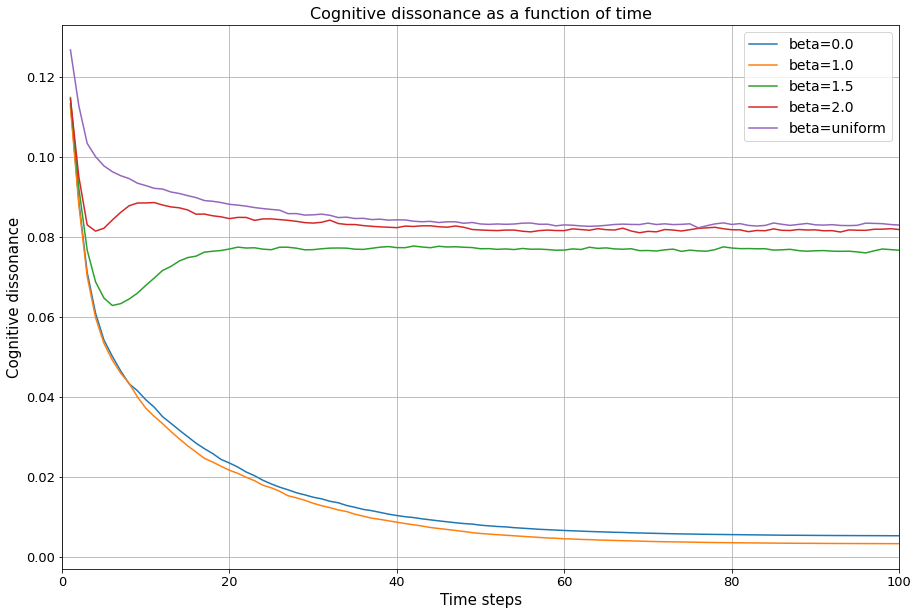

In [138]:
plot_loaded(data, xlim=200, ylim = [0, 0.9], title="BA-network, N=100, m=5, 15 conspirators, linear updates")
plot_dirtrust(data, xlim=100, ylim = [0.4, 0.9], title="BA-network, N=100, m=5, 15 conspirators, linear updates")
plot_cd(data)

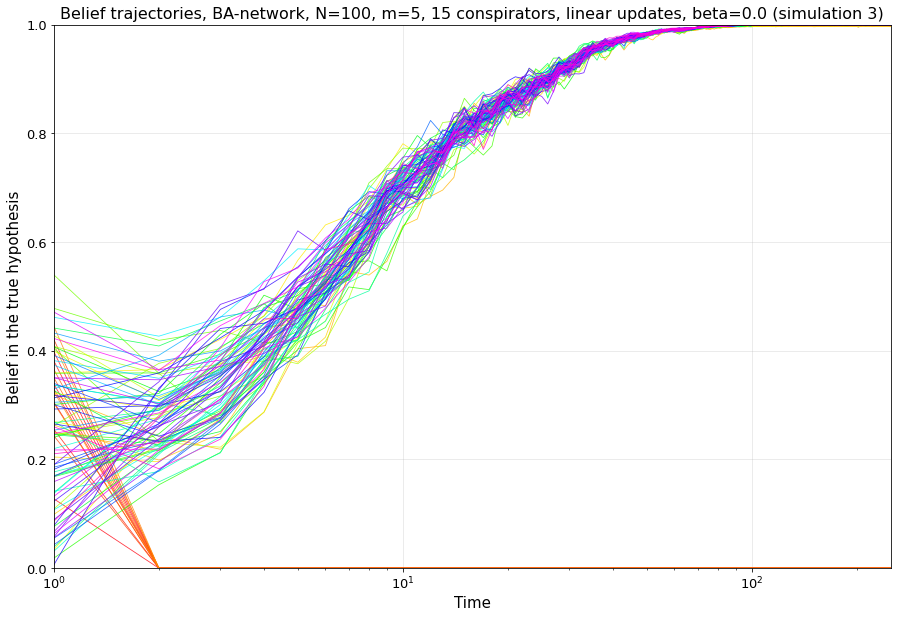

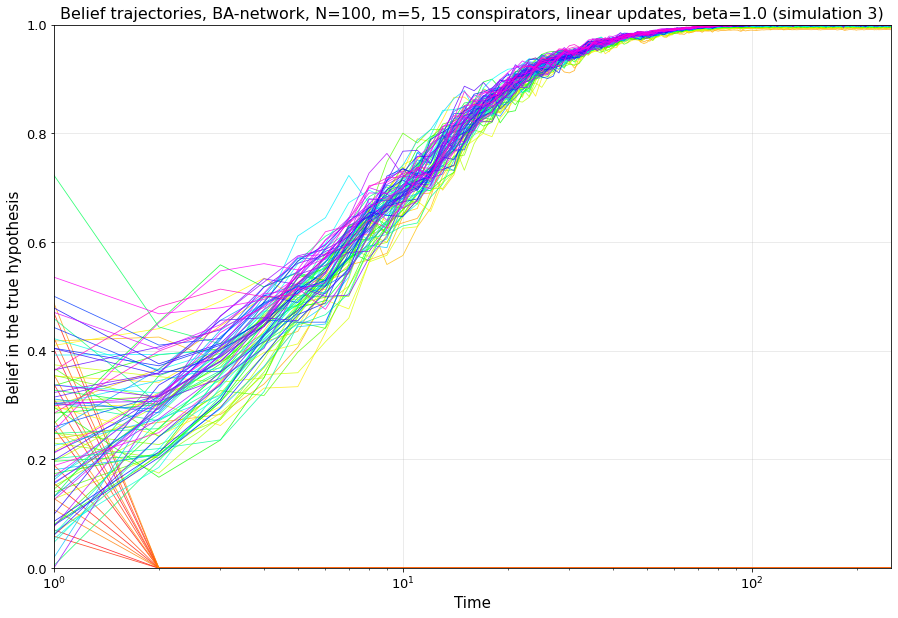

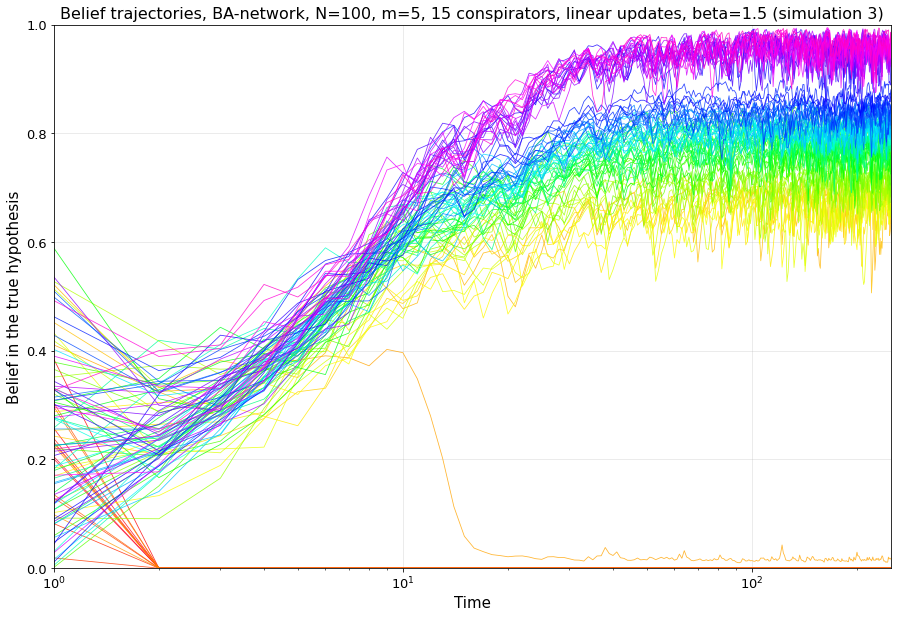

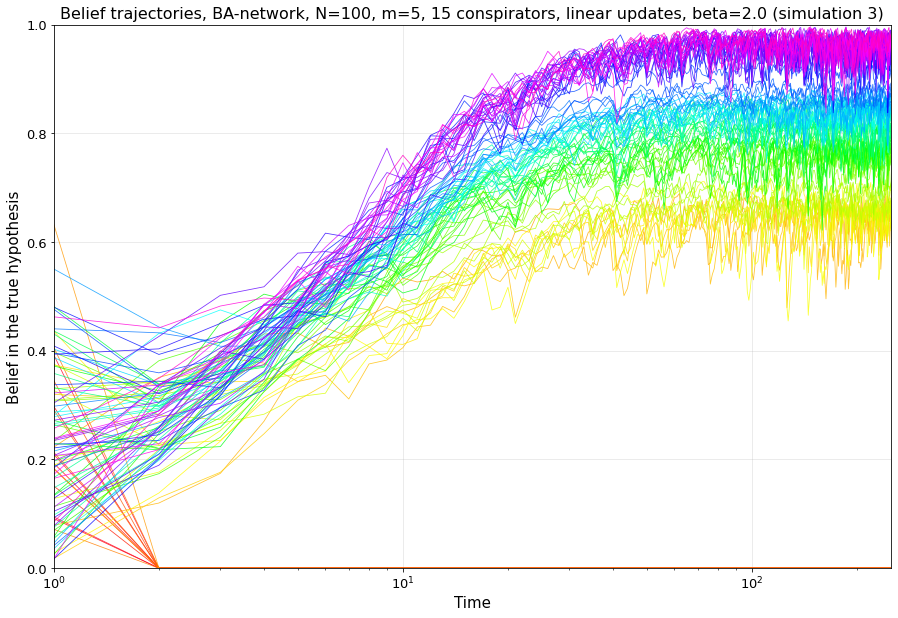

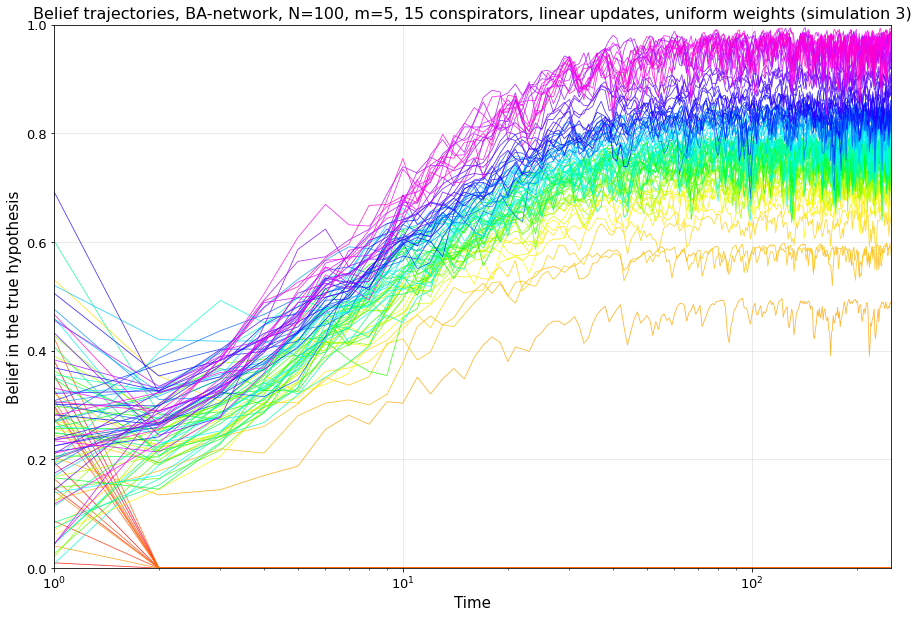

In [139]:

#plot_all_agent_beliefs(folder_name, title_suffix="BA-network, N=100, m=5, 15 conspirators")
plot_all_agent_beliefs_single(folder_name, title_suffix="BA-network, N=100, m=5, 15 conspirators, linear updates", sim_index=3)

In [140]:
folder_name = r"C:\Users\bibia\OneDrive\OneDrive - NTNU\5. klasse\Prosjektoppgaven\DHT-simulations-misinformation-propagation-main\Data files\Time evolution\BA_55_consp"
data = load_folder(folder_name)

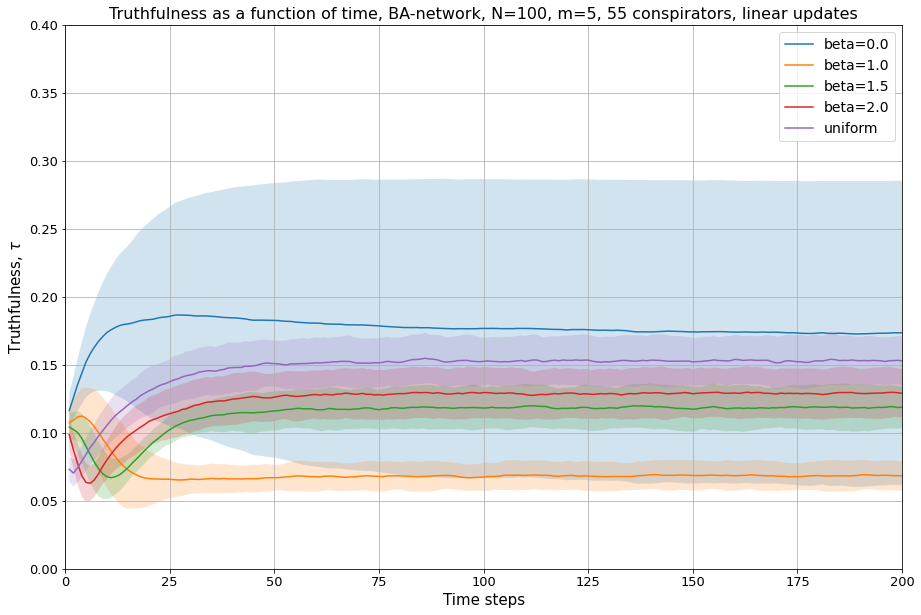

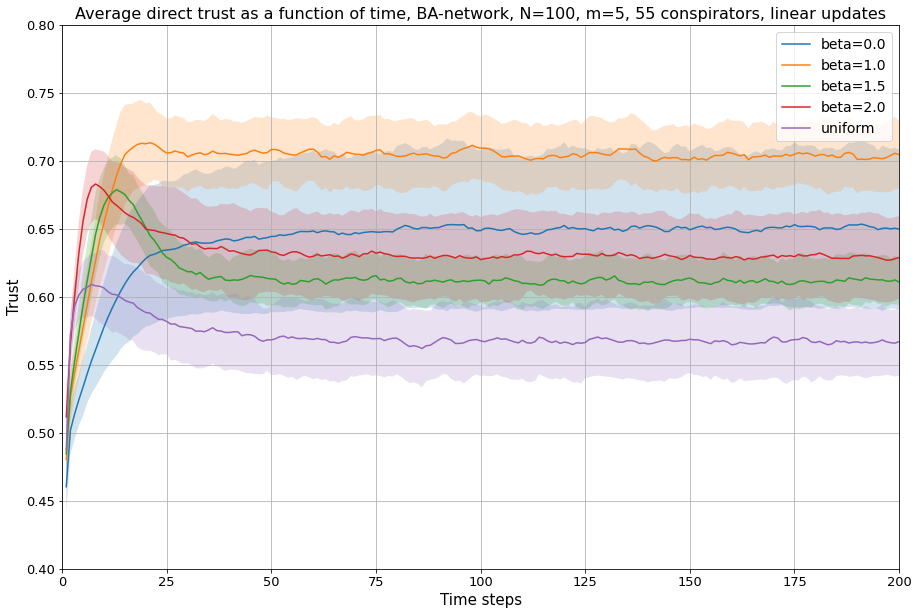

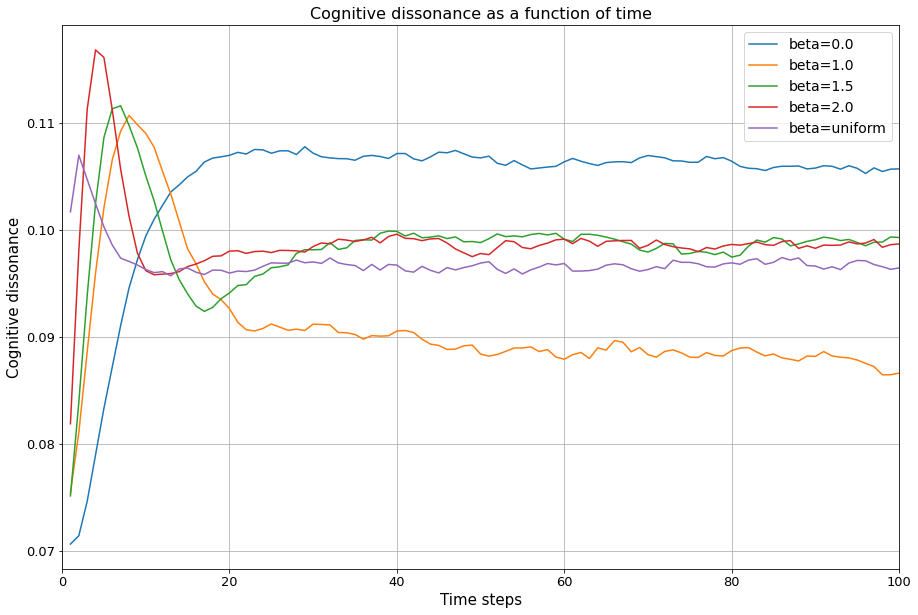

In [141]:
plot_loaded(data, xlim=200, ylim=[0, 0.4], title="BA-network, N=100, m=5, 55 conspirators, linear updates")
plot_dirtrust(data, xlim=200, ylim=[0.4, 0.8], title="BA-network, N=100, m=5, 55 conspirators, linear updates")
plot_cd(data)

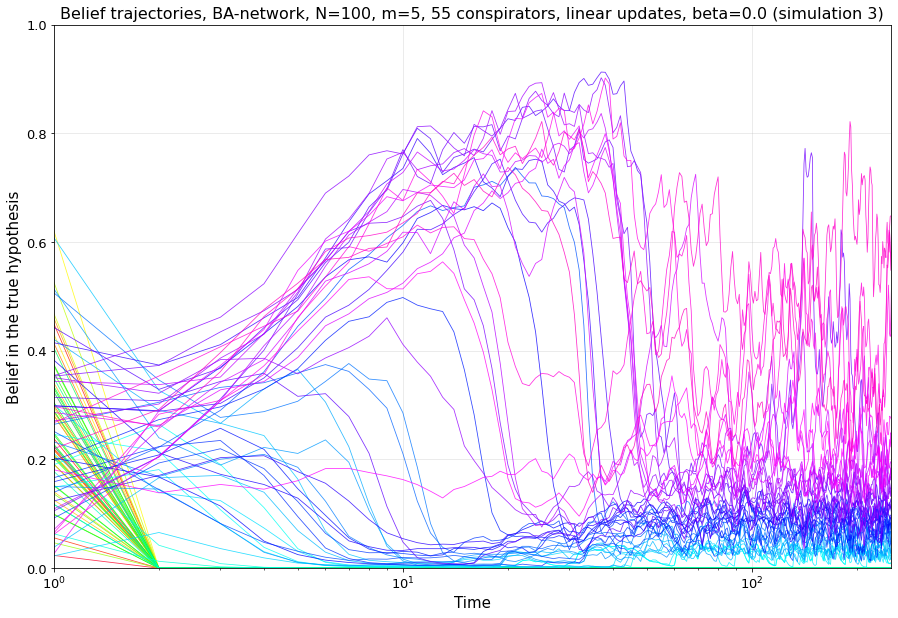

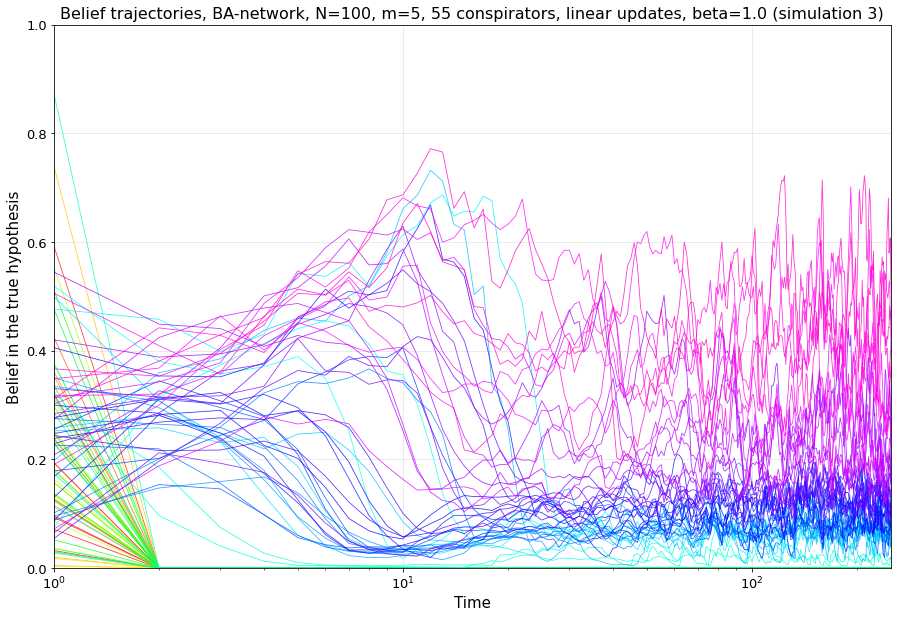

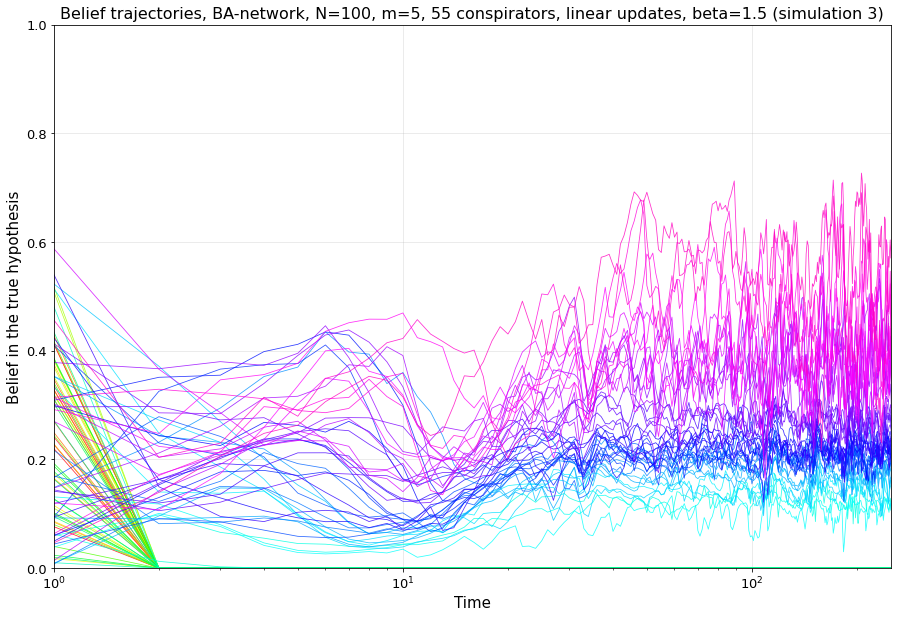

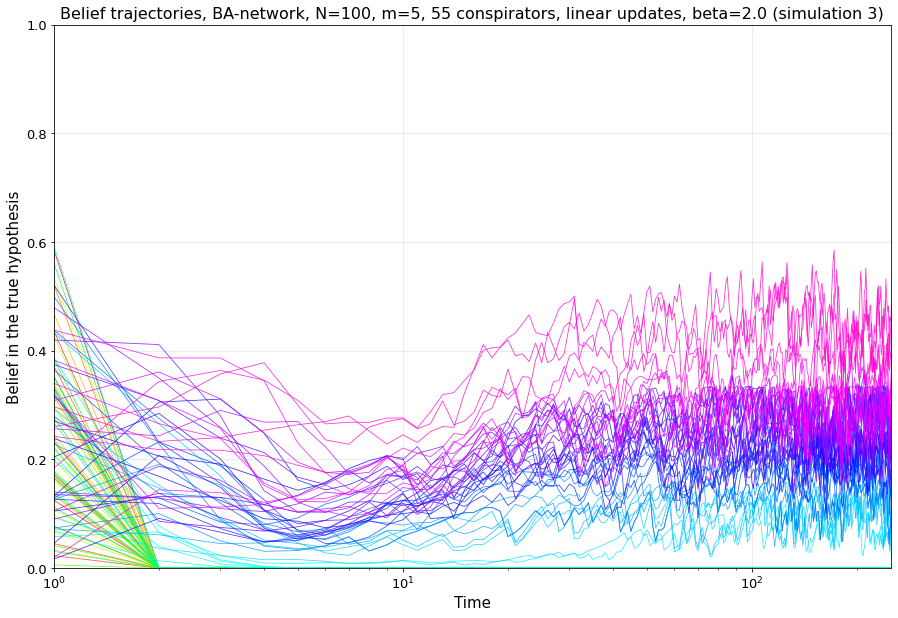

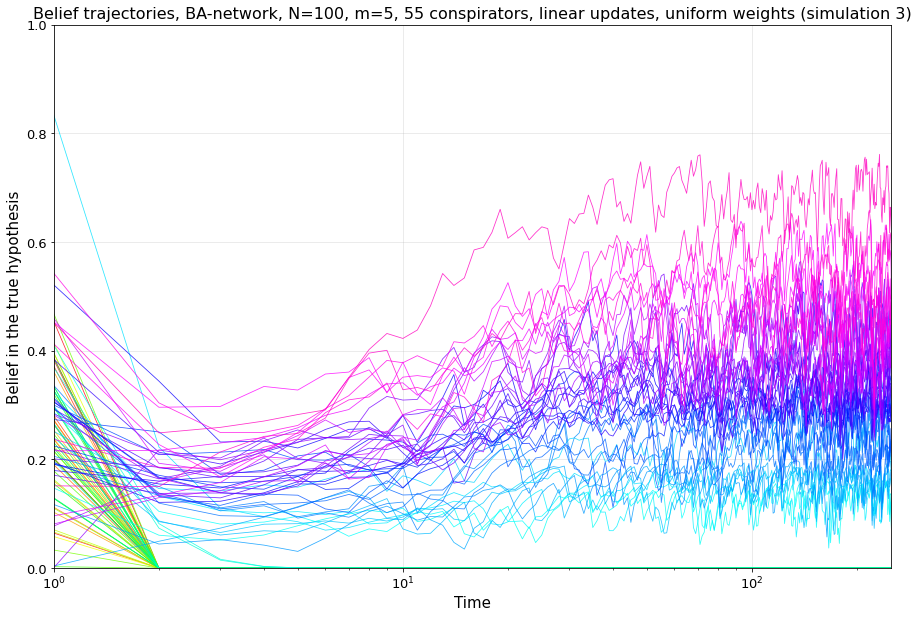

In [142]:
#plot_all_agent_beliefs(folder_name, title_suffix="BA-network, N=100, m=5, 55 conspirators")
plot_all_agent_beliefs_single(folder_name, title_suffix="BA-network, N=100, m=5, 55 conspirators, linear updates", sim_index=3)

In [143]:
folder_name = r"C:\Users\bibia\OneDrive\OneDrive - NTNU\5. klasse\Prosjektoppgaven\DHT-simulations-misinformation-propagation-main\Data files\Time evolution\BA_1_consp_log"
data = load_folder(folder_name)

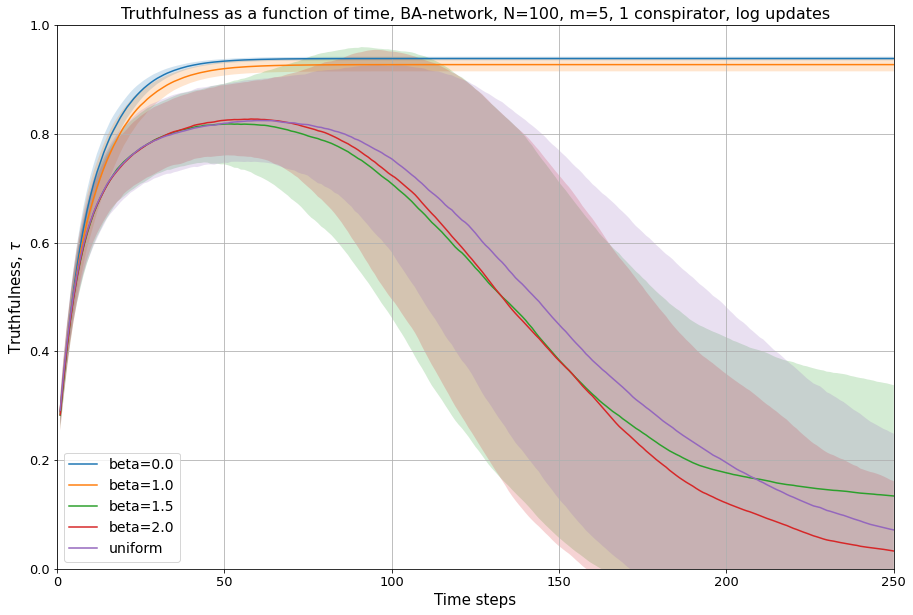

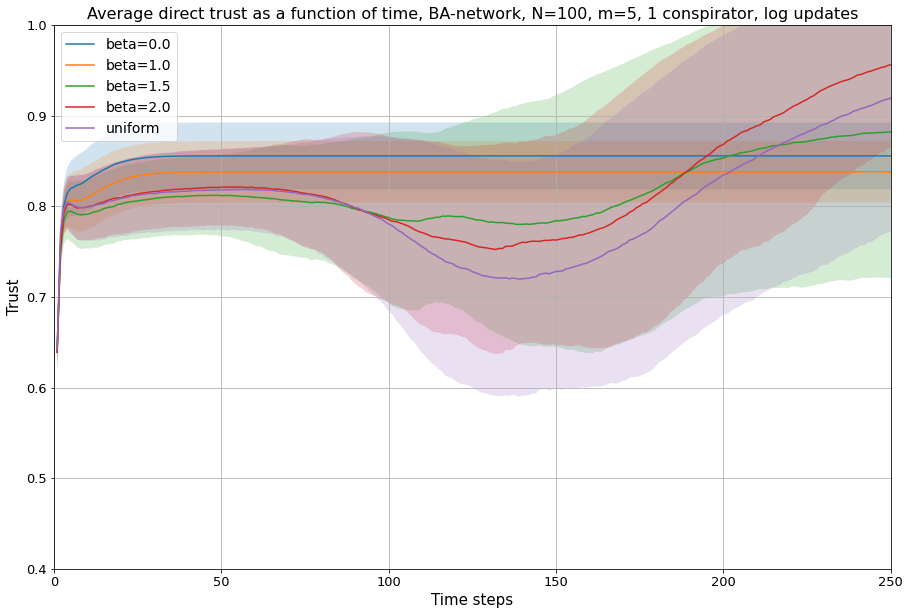

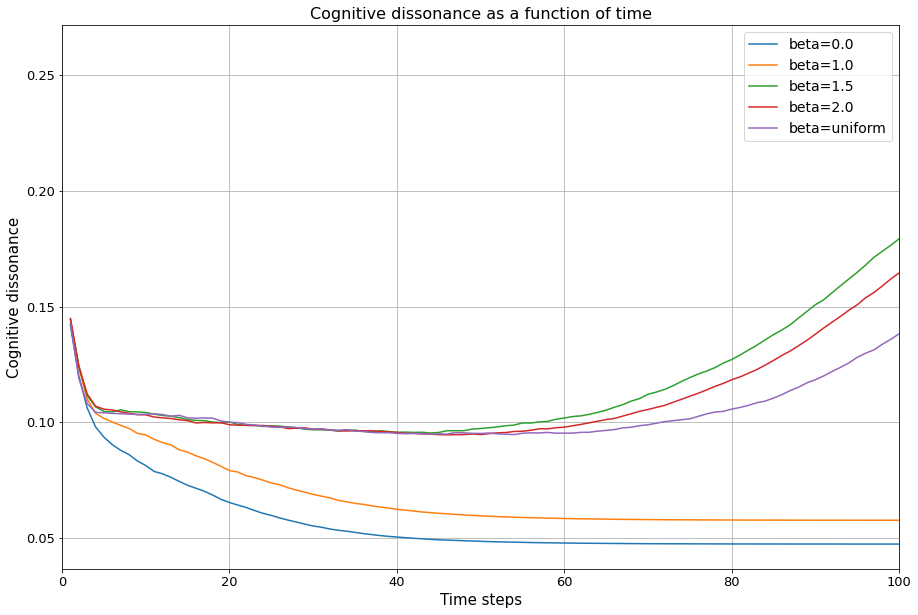

In [144]:
plot_loaded(data, xlim=250, title="BA-network, N=100, m=5, 1 conspirator, log updates")
plot_dirtrust(data, xlim=250, title="BA-network, N=100, m=5, 1 conspirator, log updates")
plot_cd(data)

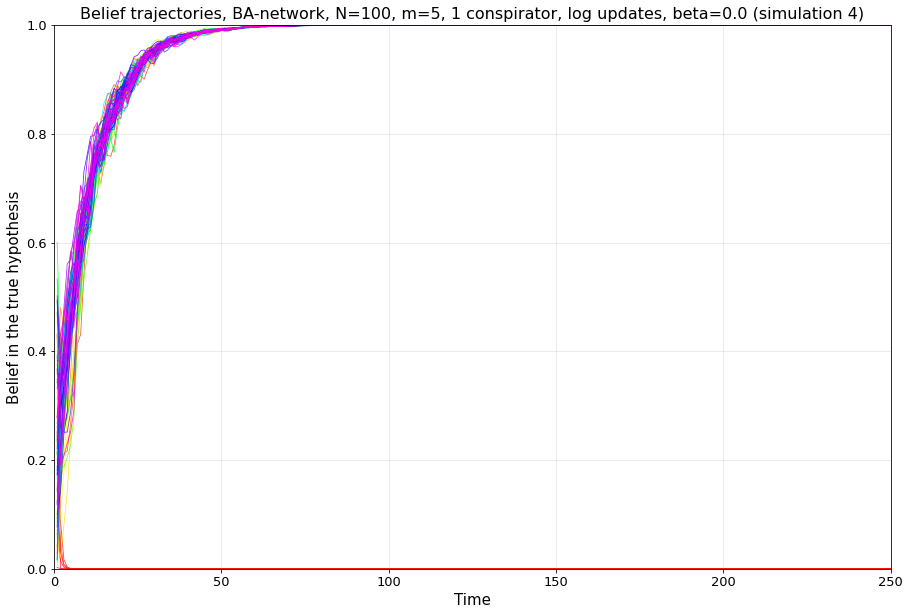

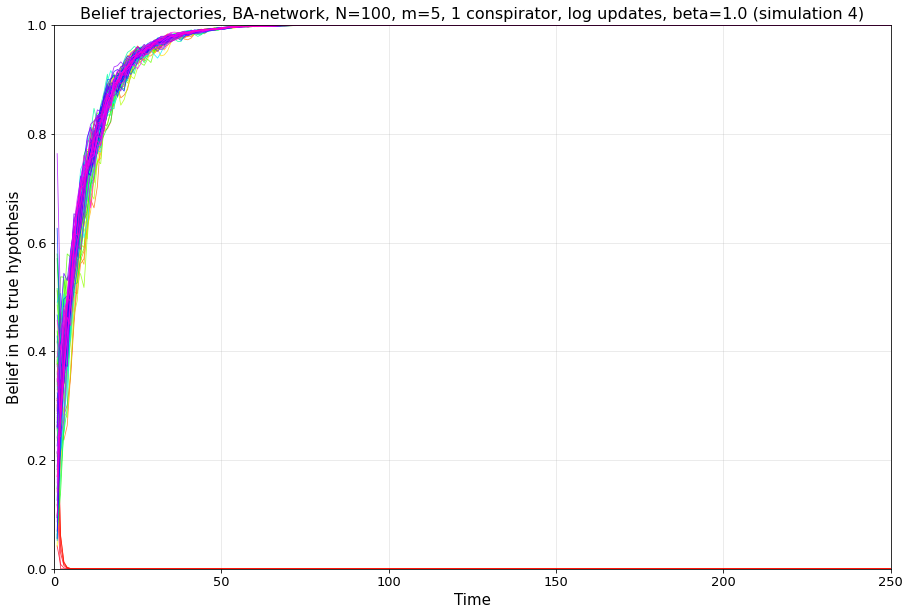

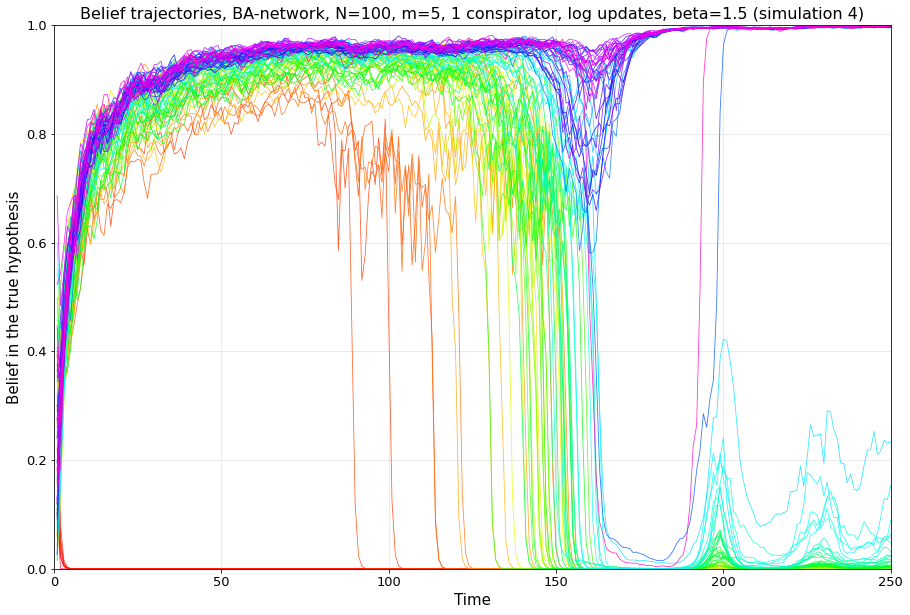

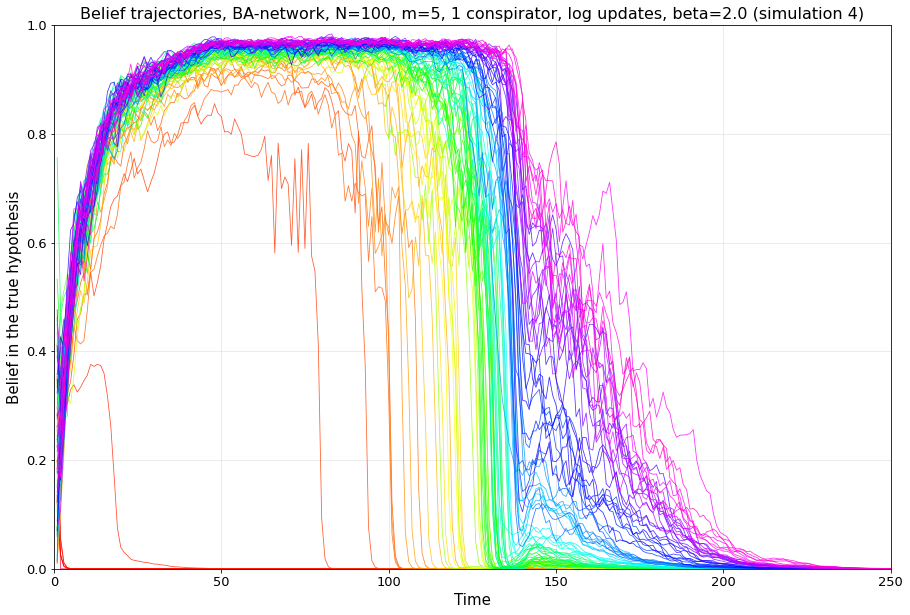

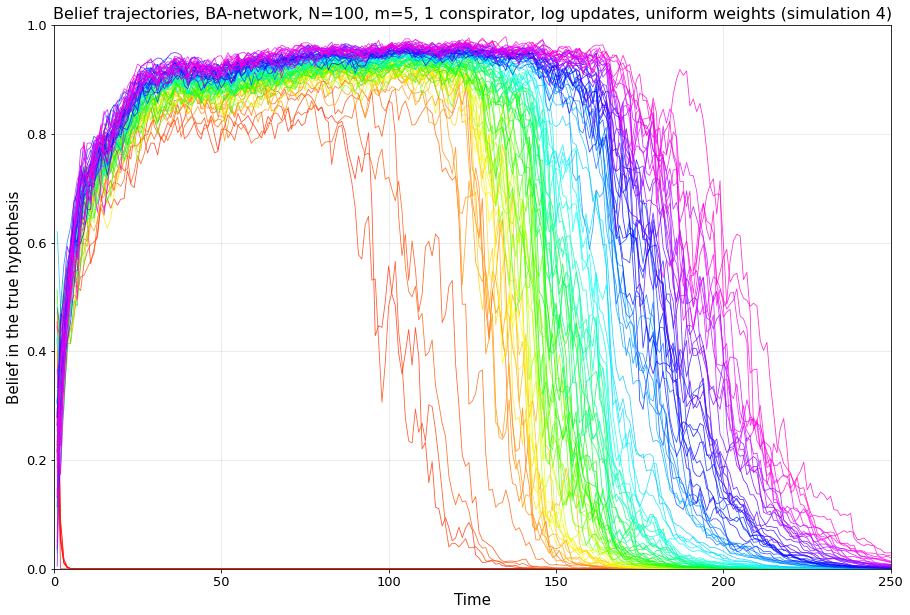

In [145]:
plot_all_agent_beliefs_single(folder_name, title_suffix="BA-network, N=100, m=5, 1 conspirator, log updates", xlim=250, xlog=False, sim_index = 4)

In [146]:
folder_name = r"C:\Users\bibia\OneDrive\OneDrive - NTNU\5. klasse\Prosjektoppgaven\DHT-simulations-misinformation-propagation-main\Data files\Time evolution\BA_4_consp_log"
data = load_folder(folder_name)

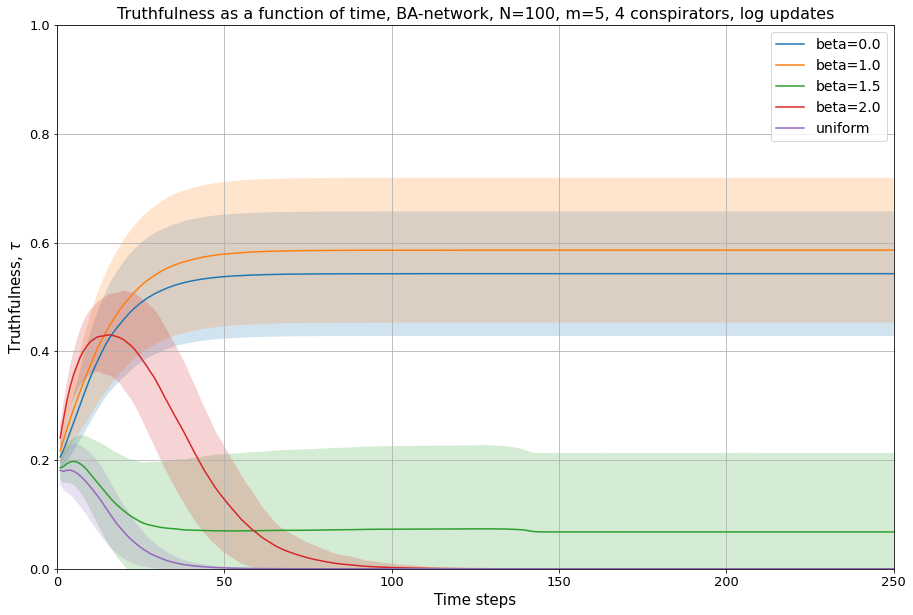

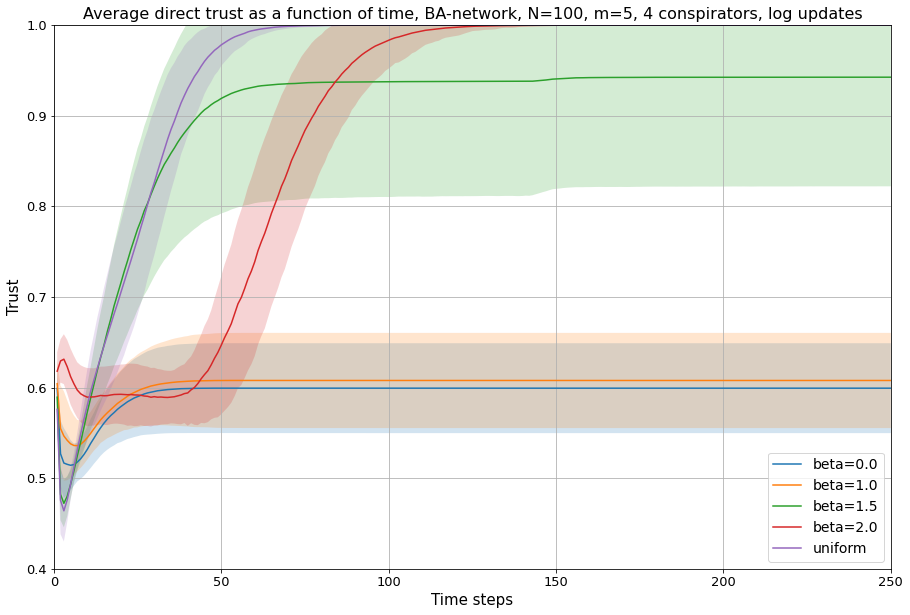

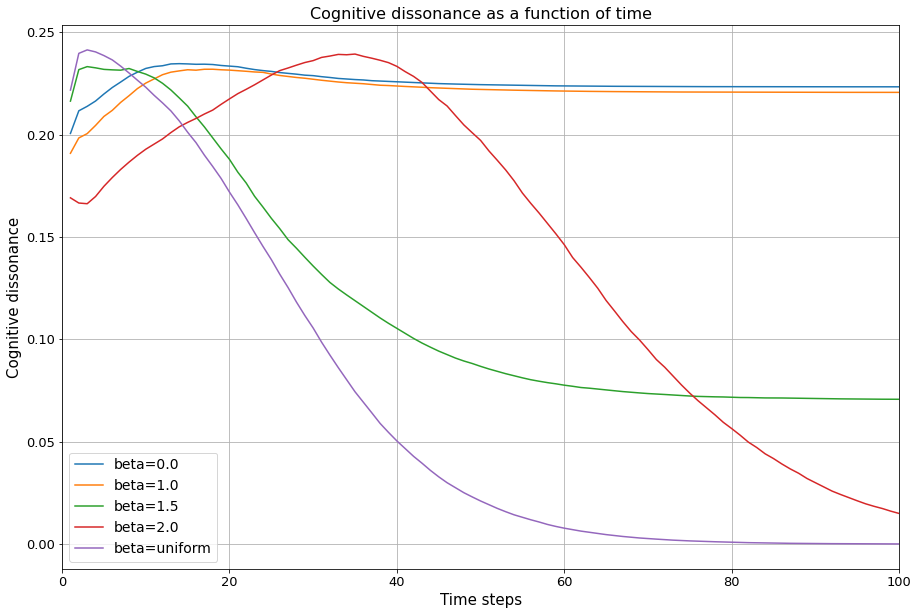

In [147]:
plot_loaded(data, xlim=250, title="BA-network, N=100, m=5, 4 conspirators, log updates")
plot_dirtrust(data, xlim=250, title="BA-network, N=100, m=5, 4 conspirators, log updates")
plot_cd(data)

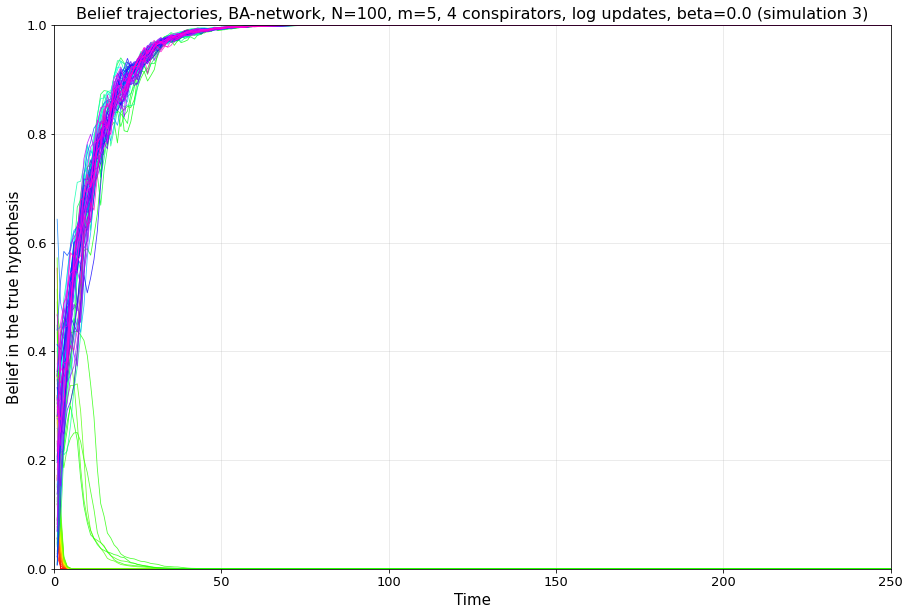

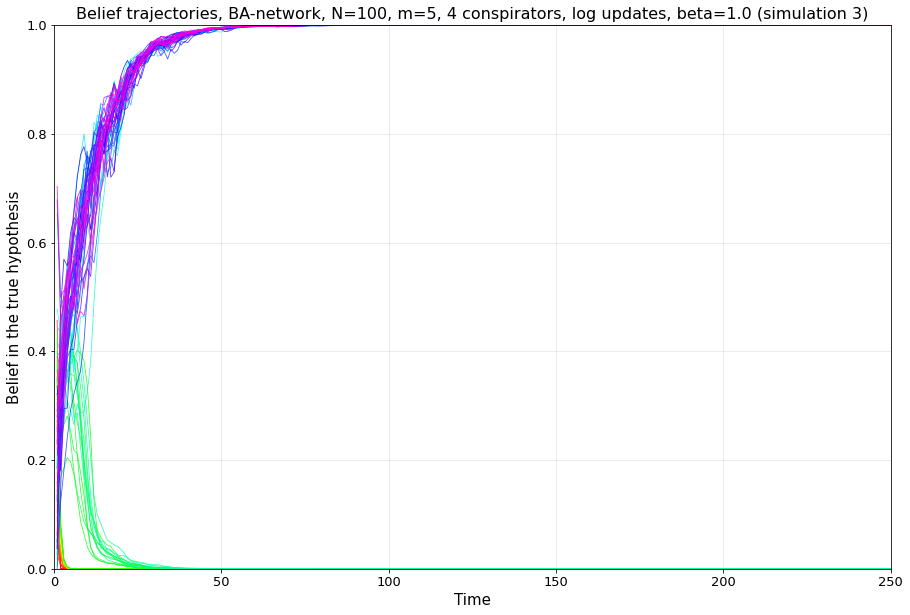

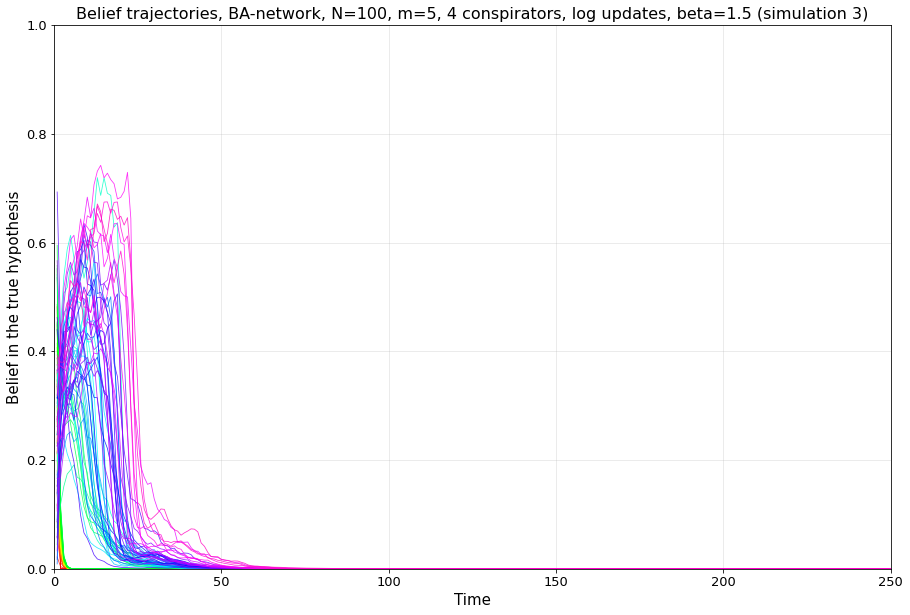

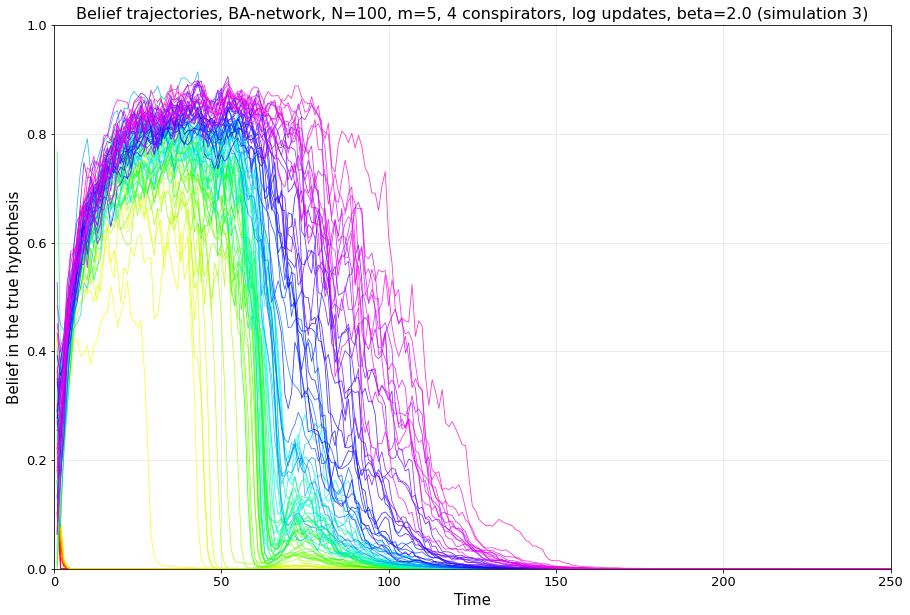

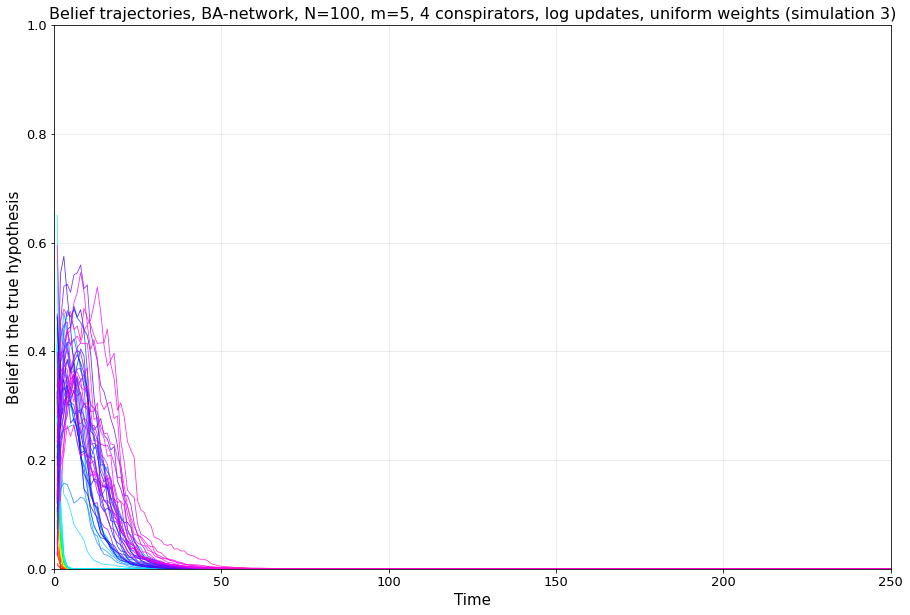

In [148]:
plot_all_agent_beliefs_single(folder_name, title_suffix="BA-network, N=100, m=5, 4 conspirators, log updates", xlog=False, sim_index=3)

In [149]:
# folder_name = r"C:\Users\bibia\OneDrive\OneDrive - NTNU\5. klasse\Prosjektoppgaven\DHT-simulations-misinformation-propagation-main\Data files\Time evolution\BA_10_consp_log"
# data = load_folder(folder_name)

In [150]:
# plot_loaded(data, xlim=200, title="BA-network, N=100, m=5, 10 conspirators, log updates")
# plot_dirtrust(data, xlim=200, title="BA-network, N=100, m=5, 10 conspirators, log updates")

In [151]:
#plot_all_agent_beliefs_single(folder_name, title_suffix="BA-network, N=100, m=5, 10 conspirators, log updates", xlog=False)

In [152]:
folder_name = r"C:\Users\bibia\OneDrive\OneDrive - NTNU\5. klasse\Prosjektoppgaven\DHT-simulations-misinformation-propagation-main\Data files\Time evolution\BA_12_consp_log"
data = load_folder(folder_name)

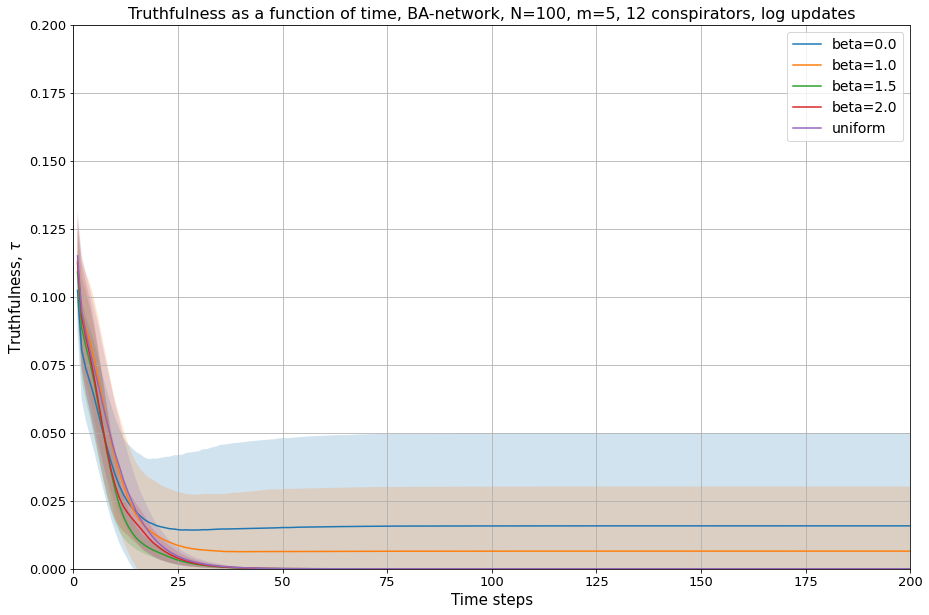

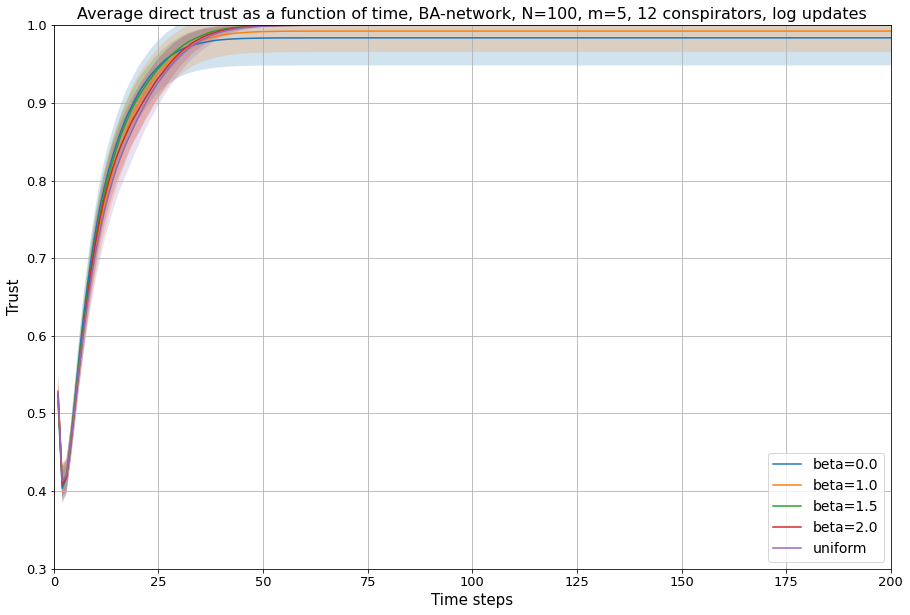

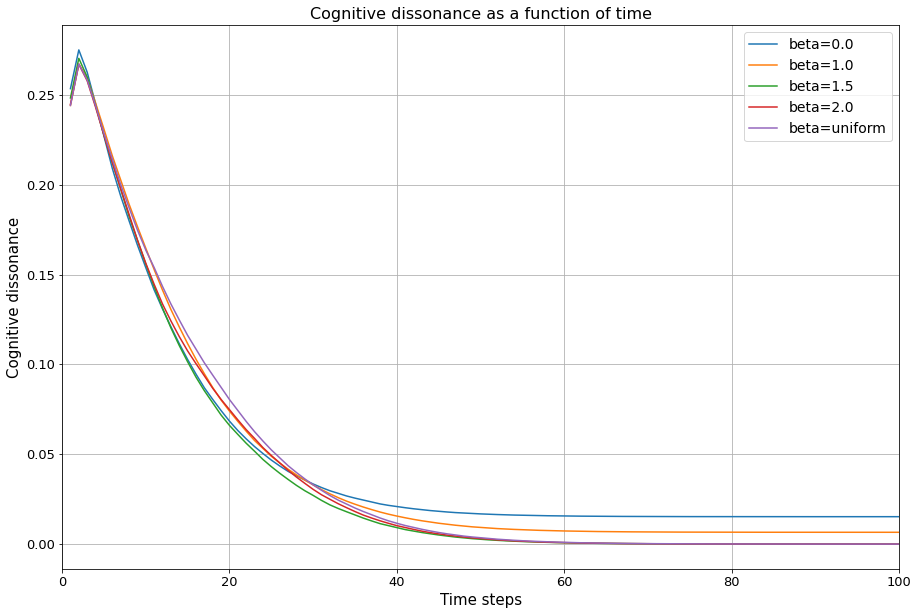

In [153]:
plot_loaded(data, xlim=200, ylim = [0, 0.2],title="BA-network, N=100, m=5, 12 conspirators, log updates")
plot_dirtrust(data, xlim=200, ylim = [0.3, 1], title="BA-network, N=100, m=5, 12 conspirators, log updates")
plot_cd(data)

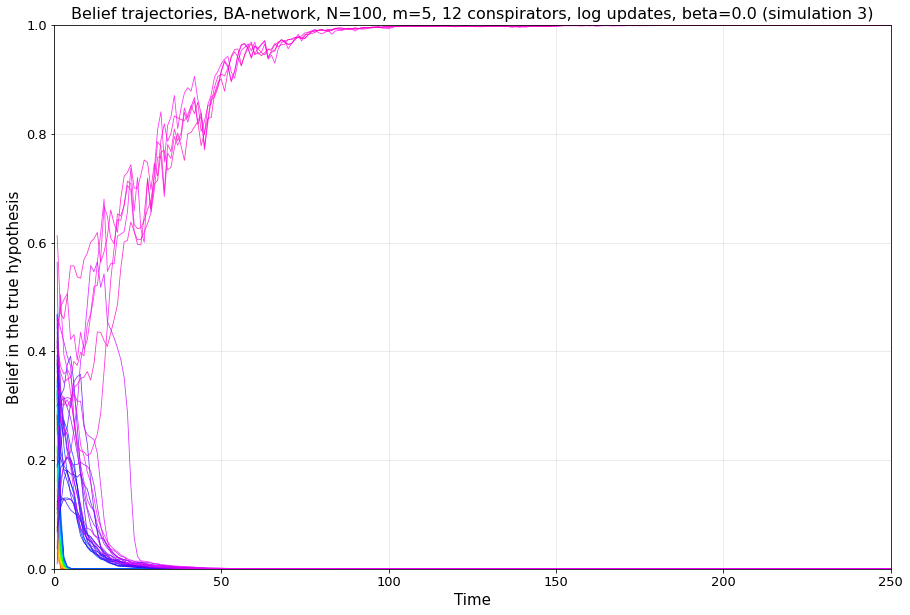

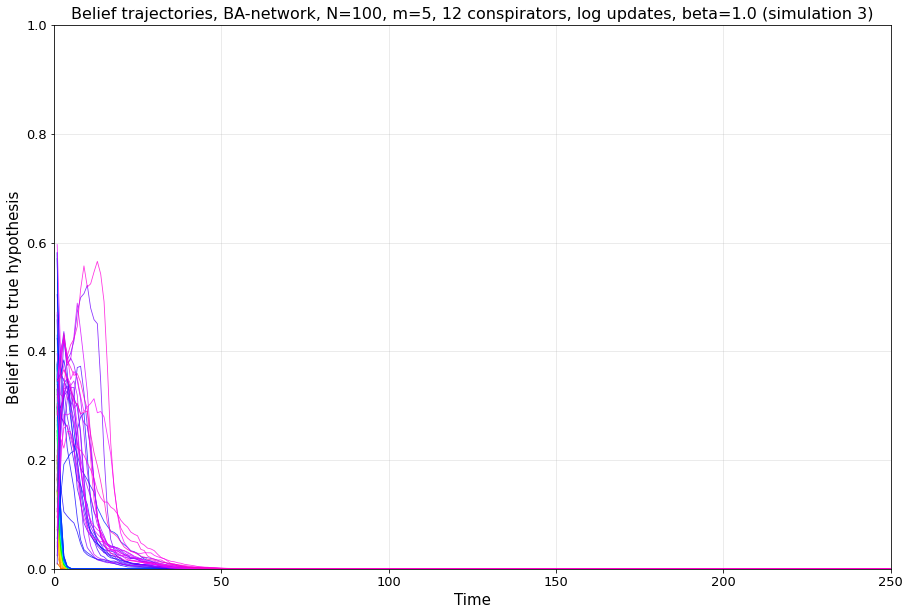

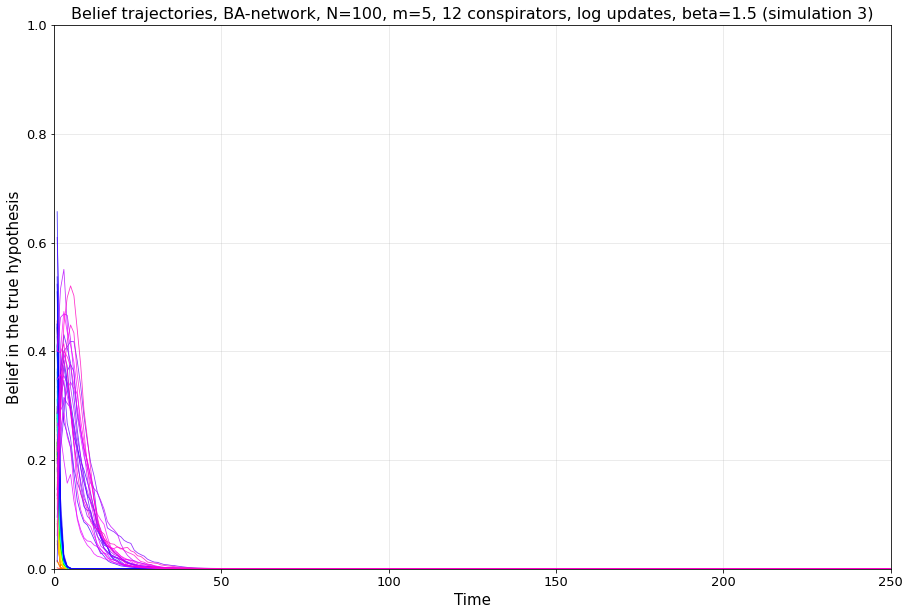

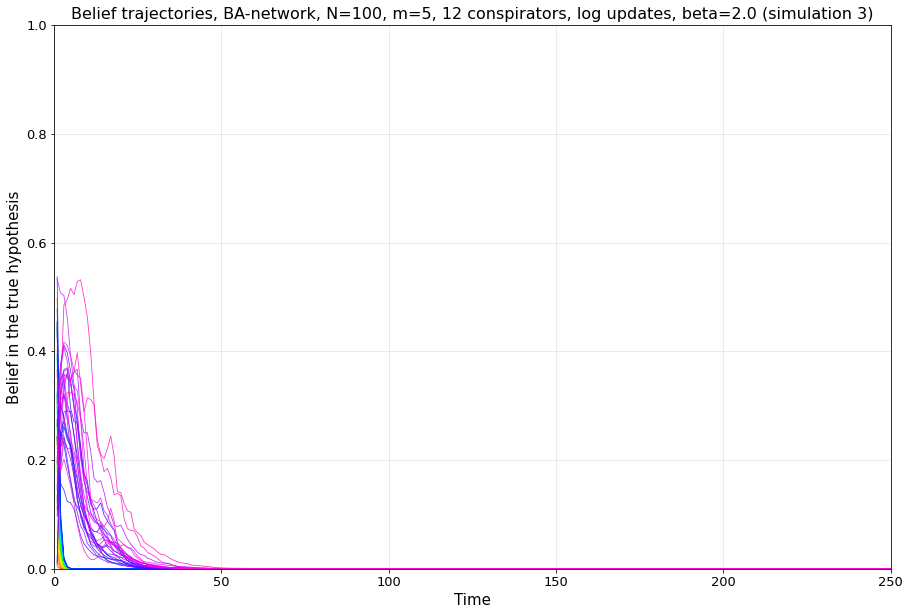

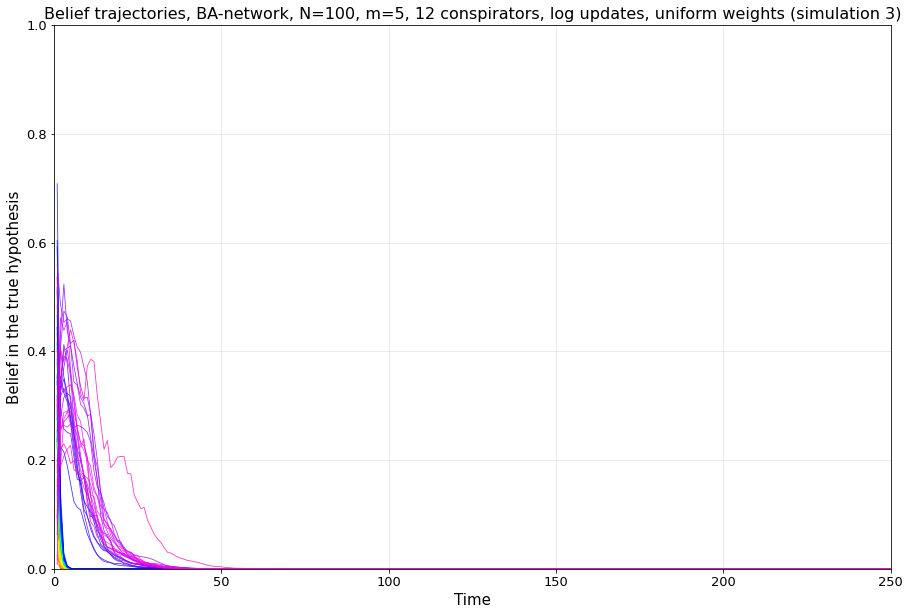

In [154]:
# Uninteresting
plot_all_agent_beliefs_single(folder_name, title_suffix="BA-network, N=100, m=5, 12 conspirators, log updates", xlog=False, sim_index=3)